In [1]:
import collections
import matplotlib
from matplotlib.patches import Polygon
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
from netCDF4 import Dataset
import numpy as np
import pandas as pd
from scipy.io import readsav
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
matplotlib.rcParams.update({'font.size': 24})

In [2]:
obs = pd.read_pickle('senex_camp_obs.pkl')
mod = pd.read_pickle('senex_camp_mod.pkl')
base = pd.read_pickle('senex_camp_base.pkl')
ozoff = pd.read_pickle('senex_camp_ozoff.pkl')
nyoff = pd.read_pickle('senex_camp_nyoff.pkl')
aloff = pd.read_pickle('senex_camp_aloff.pkl')

In [3]:
polvars = collections.OrderedDict()
polvars['CH3COCH3'] = ['ACETONE_PPTV', 'Acetone']
polvars['CO'] = ['CO_PPBV', 'CO']
polvars['CH2O'] = ['HCHO_PPBV', 'HCHO']
polvars['HNO3'] = ['HNO3_PPBV', r'$HNO_3$']
polvars['ISOP'] = ['ISOPRENE_PPTV', 'Isoprene']
polvars['CH4'] = ['CH4_PPBV', 'Methane']
polvars['CH3OH'] = ['METHANOL_PPTV', 'Methanol']
polvars['MVK_MACR'] = ['MVK_MACR_PPTV', 'MVK + MACR']
polvars['C10H16'] = ['MONOTERPENES_PPTV', 'Monoterpenes']
polvars['NH3'] = ['NH3_PPBV', r'$NH_3$']
polvars['NOx'] = ['NOx', 'NOx']
polvars['NOy'] = ['NOY_PPBV', 'NOy']
polvars['O3'] = ['O3_PPBV', r'$O_3$']
polvars['PAN'] = ['PAN_PPBV', 'PAN']
polvars['SO2'] = ['SO2_PPBV', r'$SO_2$']

# __Skip this section if using pickles__

### Retrieve aircraft observations

In [142]:
obsf = readsav('idl/mrg60s_P3.sav')
p3vars = ['DOY', 'DATE', 'UTC_MID', 
          'GPSLAT', 'GPSLON', 'STATICPRS',  
          'AMBTEMP', 'DEWPTTEMP', 'H2OMR', 'RELHUMIDITY',
          'ACETONE_PPTV', 'ACETONITRILE_PPTV', 'CH4_PPBV', 'CO_PPBV', 
          'ISOPRENE_PPTV', 'HCHO_PPBV', 'HNO3_PPBV', 'HONO_PPBV', 
          'METHANOL_PPTV', 'MONOTERPENES_PPTV', 'MVK_MACR_PPTV', 
          'NH3_PPBV', 'NO_PPBV', 'NO2_PPBV', 'NOY_PPBV', 'O3_PPBV', 
          'PAN_PPBV', 'PPN_PPBV', 'SO2_PPBV']

obs = pd.DataFrame({})
for i in p3vars:
    obs[i] = obsf.p3[i][0].byteswap().newbyteorder()
    
obs['pint'] = np.round(obs['STATICPRS'], -1) # plot small variations in vertical profile
obs['sdpt'] = np.round(obs['STATICPRS'], -2) # necessary for taking the standard deviation at many levels
obs['NOx'] = np.ma.masked_invalid(obs['NO_PPBV']) + np.ma.masked_invalid(obs['NO2_PPBV'])

In [143]:
obs['daysfrm_start'] = obs['DOY'] - (31 + 28 + 31 + 30 + 31)
time_day = obs['DOY'] - (31 + 28 + 31 + 30 + 31)
lon_obs = obs['GPSLON']
lat_obs = obs['GPSLAT']
pres_obs = obs['STATICPRS']

In [144]:
# Fill NaNs:
# There are several rows in which the aircraft malfunctions (indices 2732:2754) 
# and records the coordinate variables as missing. The difference between when 
# this starts and ends for latitude degrees is <1, while for longitudes it is <0.25. 
# Because this is within the range of a single model grid cell, the indices for 
# coordinate values are assigned the value of the last grid cell with content.  
# They are not discarded because the aircraft still recorded meaningful values 
# for pollutant observations over these cells.

for v in [lat_obs, lon_obs, pres_obs]:
    for i in range(len(time_day)):
        if np.isnan(v[i])==True:
            v[i] = v[i-1]

### Subset model along flight tracks

In [9]:
def sub_model(folder): # This takes roughly 10 min to run.
    modf = Dataset('../../simulations/' + folder + '/senex.atmos_hourly.sub.nc', 'r')

    # Assign model to Pandas dataframe
    mod = pd.DataFrame({})
    pres_edge = np.arange(46).reshape(2,23)
    pres_edge[0,:] = modf.variables['pfull_sub01'][0:23]
    pres_edge[1,:] = modf.variables['pfull_sub01'][1:24]

    for p in polvars:
        mod[p] = np.zeros(len(time_day))
    for v in ['TIME', 'PRES', 'LAT', 'LON']:
        mod[v] = np.zeros(len(time_day))
        
    # AM3 starts on day 0, while SENEX values start on day 1. So even though there are 1247
    # days between 2010/01/01 and 2013/06/01, subtract 1246 to make model time comparable with obs.
    for idx, val in list(enumerate(time_day.index.values)):
        ti = np.where((time_day[val] >= modf.variables['average_T1'][:] - 1246.) &
                      (time_day[val] <= modf.variables['average_T2'][:] - 1246.))[0][0]
        if (modf.variables['average_T1'][ti] - 1246.) - time_day[val] > 1:
            continue
        xi = np.where((lon_obs[val] >= modf.variables['grid_xt_bnds'][:, 0] - 180.) &
                      (lon_obs[val] <= modf.variables['grid_xt_bnds'][:, 1] - 180.))[0][0]
        yi = np.where((lat_obs[val] >= modf.variables['grid_yt_bnds'][:, 0]) &
                      (lat_obs[val] <= modf.variables['grid_yt_bnds'][:, 1]))[0][0]
        if pres_obs[val] > 996.:
            zi = len(modf.variables['pfull_sub01'])-1
        else:
            zi = np.where((pres_obs[val] >= pres_edge[0, :]) & 
                      (pres_obs[val] <= pres_edge[1, :]))[0][0]
            
        for v in polvars:
            if v=='MVK_MACR':
                mod[v][idx] = modf.variables['MVK'][ti, zi, yi, xi] + modf.variables['MACR'][ti, zi, yi, xi]
            elif v=='NOx':
                mod[v][idx] = modf.variables['NO'][ti, zi, yi, xi] + modf.variables['NO2'][ti, zi, yi, xi]
            elif v=='NOy':
                mod[v][idx] = modf.variables['NO'][ti, zi, yi, xi] + modf.variables['NO2'][ti, zi, yi, xi] + \
                             modf.variables['HNO3'][ti, zi, yi, xi] + modf.variables['PAN'][ti, zi, yi, xi] + \
                             modf.variables['N2O5'][ti, zi, yi, xi] + modf.variables['MVKN'][ti, zi, yi, xi] + \
                             modf.variables['MACRN'][ti, zi, yi, xi] + modf.variables['R4N2'][ti, zi, yi, xi]
            else:
                mod[v][idx] = modf.variables[v][ti, zi, yi, xi]
        mod['TIME'][idx] = modf.variables['average_T1'][ti]
        mod['LON'][idx] = modf.variables['grid_xt'][xi]
        mod['LAT'][idx] = modf.variables['grid_yt'][yi]
        mod['PRES'][idx] = modf.variables['pfull_sub01'][zi]
    
    for p in polvars: # Convert units
        if p in ['C10H16', 'CH3COCH3', 'ISOP', 'MVK_MACR']:
            mod[p] = mod[p] * 1e12
        else:
            mod[p] = mod[p] * 1e9
        
    mod['pint'] = np.round(mod['PRES'], -1) # Prep step for taking the mean over pressure intervals
    
    return mod;

In [10]:
#base = sub_model('base')
#ozoff = sub_model('oz_dd_off_usa')
#nyoff = sub_model('noy_dd_off_usa')
aloff = sub_model('all_dd_off_usa')

In [145]:
a = obs['NO2_PPBV']>4. # Urban
#base = base.drop(base.index[a])
#ozoff = ozoff.drop(ozoff.index[a])
#nyoff = nyoff.drop(nyoff.index[a])
#aloff = aloff.drop(aloff.index[a])
obs = obs.drop(obs.index[a])

b = obs['O3_PPBV']/obs['CO_PPBV']>1.25
#base = base.drop(base.index[b])
#ozoff = ozoff.drop(ozoff.index[b])
#nyoff = nyoff.drop(nyoff.index[b])
#aloff = aloff.drop(aloff.index[b])
obs = obs.drop(obs.index[b])

c = obs['ACETONITRILE_PPTV']>200. # Fire
#base = base.drop(base.index[c])
#ozoff = ozoff.drop(ozoff.index[c])
#nyoff = nyoff.drop(nyoff.index[c])
#aloff = aloff.drop(aloff.index[c])
obs = obs.drop(obs.index[c])

In [146]:
obs.to_pickle('senex_camp_obs.pkl')
base.to_pickle('senex_camp_base.pkl')
ozoff.to_pickle('senex_camp_ozoff.pkl')
nyoff.to_pickle('senex_camp_nyoff.pkl')
aloff.to_pickle('senex_camp_aloff.pkl')

# Start again here if using pickles

### Plot vertical profiles
__Campaign mean__

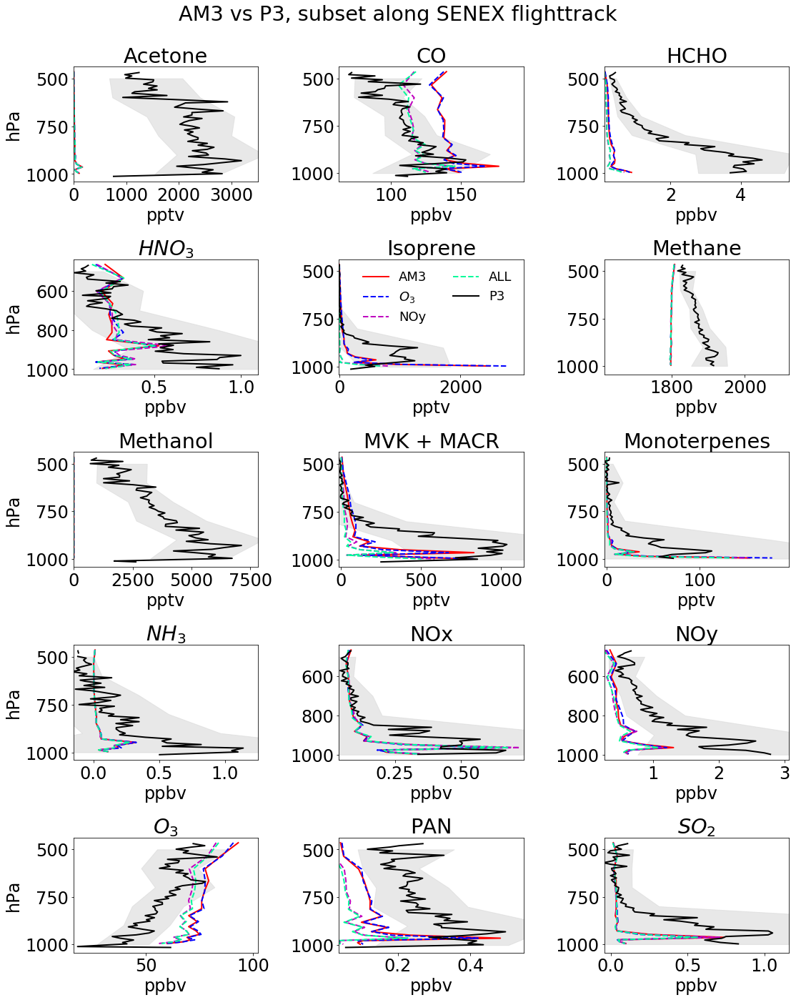

In [194]:
fig = plt.figure(figsize=[16,20])
obp = obs.groupby('pint').mean()
osd = obs.groupby('sdpt').mean()
sdv = obs.groupby('sdpt').std()
bsp = base.groupby('pint').mean()
ozp = ozoff.groupby('pint').mean()
nyp = nyoff.groupby('pint').mean()
alp = aloff.groupby('pint').mean()
for idx, p in enumerate(polvars):
    ax = fig.add_subplot(5, 3, idx+1)
    bsp.plot(p, 'PRES', ax=ax, label='AM3', c='r', linewidth=2)
    ozp.plot(p, 'PRES', ax=ax, label='$O_3$', c='b', linewidth=2, linestyle='--')
    nyp.plot(p, 'PRES', ax=ax, label='NOy', c='m', linewidth=2, linestyle='--')
    alp.plot(p, 'PRES', ax=ax, label='ALL', c='mediumspringgreen', linewidth=2, linestyle='--')
    ax.fill_betweenx(sdpt, osd[polvars[p][0]]-sdv[polvars[p][0]], osd[polvars[p][0]]+sdv[polvars[p][0]],
                    color='lightgray', alpha=0.5)
    obp.plot(polvars[p][0], 'STATICPRS', xerr=sdv[polvars[p][0]], label='P3', c='k', linewidth=2, ax=ax)
    plt.xlim([np.min([obp[polvars[p][0]].min() - 0.1*obp[polvars[p][0]].min(), 
                      bsp[p].min() - 0.1*bsp[p].min(), 
                      ozp[p].min() - 0.1*ozp[p].min()]), 
              np.max([obp[polvars[p][0]].max() + 0.1*obp[polvars[p][0]].max(), 
                      bsp[p].max() + 0.1*bsp[p].max(),
                      ozp[p].max() + 0.1*ozp[p].max()])])
    plt.gca().invert_yaxis()
    if idx==4:
        plt.legend(loc='best', frameon=False, fontsize=18, ncol=2)
    else:
        ax.legend_.remove()
    plt.title(polvars[p][1])
    if idx%3==0:
        plt.ylabel('hPa')
    if p!='NOx':
        plt.xlabel(polvars[p][0][-4:].lower())
    else:
        plt.xlabel('ppbv')

plt.suptitle('AM3 vs P3, subset along SENEX flighttrack')        
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.savefig('senex_prof_pandas.jpg')

In [4]:
def getNEmap(axid):#, flt_lat, flt_lon):
    
        map = Basemap(projection='merc', lat_0 = 36., 
                lon_0 = -86.,
                resolution = 'l', llcrnrlon=-101., llcrnrlat=26., 
                urcrnrlon=-71., urcrnrlat=46., ax=axid)

        map.drawmapboundary()
        map.drawparallels(np.arange(-90., 90., 30.))
        map.drawmeridians(np.arange(-180., 180., 30.))
        map.drawstates(color='dimgray')
        map.drawcoastlines(color='dimgray')
        map.drawcountries(color='dimgray')
        
        #x, y = map(flt_lon, flt_lat)
            
        return map;#, x, y;

In [5]:
def draw_screen_poly( lats, lons, m, col):
    mlons = [lons[0], lons[0], lons[1], lons[1]]
    mlats = [lats[0], lats[1], lats[1], lats[0]]
    x, y = m( mlons, mlats )
    xy = zip(x,y)
    poly = Polygon( xy, facecolor=col, alpha=0.4 )
    plt.gca().add_patch(poly)

In [22]:
def date_vertprof(date):
    if date==20130618:
        return None
    
    obp = obs[obs['DATE']==date]
    if date>=20130701:
        bsp = base[base['TIME']>=1277.]
        bsp = bsp[bsp['TIME'] - obp['DOY'] - 1276. < 1]
        ozp = ozoff[ozoff['TIME']>=1277.]
        ozp = ozp[ozp['TIME'] - obp['DOY'] - 1276. < 1]
        nyp = nyoff[nyoff['TIME']>=1277.]
        nyp = nyp[nyp['TIME'] - obp['DOY'] - 1276. < 1]
        alp = aloff[aloff['TIME']>=1277.]
        alp = alp[alp['TIME'] - obp['DOY'] - 1276. < 1]
    else:
        bsp = base[base['TIME']<1277.]
        bsp = bsp[bsp['TIME'] - obp['DOY'] - 1246. < 1]
        ozp = ozoff[ozoff['TIME']<1277.]
        ozp = ozp[ozp['TIME'] - obp['DOY'] - 1246. < 1]
        nyp = nyoff[nyoff['TIME']<1277.]
        nyp = nyp[nyp['TIME'] - obp['DOY'] - 1246. < 1]
        alp = aloff[aloff['TIME']<1277.]
        alp = alp[alp['TIME'] - obp['DOY'] - 1246. < 1]
        
    fig = plt.figure(figsize=[18,16])
    ax = fig.add_subplot(4, 4, 1)
    lats = [bsp['LAT'].min()-1., bsp['LAT'].max()+1.]
    lons = [bsp['LON'].min()-180.-1.25, bsp['LON'].max()-180.+1.25]
    bmap = getNEmap(ax)#, obp['GPSLAT'].values, obp['GPSLON'].values)
    x, y = bmap(obp['GPSLON'].values, obp['GPSLAT'].values)
    draw_screen_poly(lats, lons, bmap, 'orangered')
    bmap.plot(x, y, c='k', linewidth=1)
    
    osd = obp.groupby('sdpt').mean()
    sdv = obp.groupby('sdpt').std()
    a = np.isnan(sdv['O3_PPBV']) # example, it doesn't matter which pollutant is used
    osd = osd.drop(osd.index[a])
    sdv = sdv.drop(sdv.index[a])
    sdp = sdv.index.values
    
    obp = obp.groupby('pint').mean()
    bsp = bsp.groupby('pint').mean()
    ozp = ozp.groupby('pint').mean()
    nyp = nyp.groupby('pint').mean()
    alp = alp.groupby('pint').mean()
    for idx, p in enumerate(polvars):
        ax = fig.add_subplot(4, 4, idx+2)
        bsp.plot(p, 'PRES', label='AM3', c='r', linewidth=2, ax=ax)
        ozp.plot(p, 'PRES', label='$O_3$', c='b', linewidth=2, linestyle='--', ax=ax)
        nyp.plot(p, 'PRES', label='NOy', color='m', linewidth=2, linestyle='--', ax=ax)
        alp.plot(p, 'PRES', label='ALL', color='mediumseagreen', linewidth=2, linestyle='--', ax=ax)
        if p=='NH3' or p=='PAN' and np.isnan(np.mean(obp[polvars[p][0]]))==True:
            plt.xlim([np.min([alp[p].min() - 0.1*alp[p].min(), 
                      bsp[p].min() - 0.1*bsp[p].min(), 
                      ozp[p].min() - 0.1*ozp[p].min()]), 
              np.max([alp[p].max() + 0.1*alp[p].max(), 
                      bsp[p].max() + 0.1*bsp[p].max(),
                      ozp[p].max() + 0.1*ozp[p].max()])])
        else:
            obv = osd[polvars[p][0]]
            isd = sdv[polvars[p][0]]
            ax.fill_betweenx(sdp, obv-isd, obv+isd, color='lightgray', alpha=0.5)
            obp.plot(polvars[p][0], 'STATICPRS', xerr=sdv[polvars[p][0]], label='P3', c='k', linewidth=2, ax=ax)
            plt.xlim([np.min([obp[polvars[p][0]].min() - 0.1*obp[polvars[p][0]].min(), 
                      bsp[p].min() - 0.1*bsp[p].min(), 
                      ozp[p].min() - 0.1*ozp[p].min()]), 
              np.max([obp[polvars[p][0]].max() + 0.1*obp[polvars[p][0]].max(), 
                      bsp[p].max() + 0.1*bsp[p].max(),
                      ozp[p].max() + 0.1*ozp[p].max()])])
        plt.gca().invert_yaxis()
        plt.xlabel('')
        plt.yticks(rotation=30)
        if idx==13:
            plt.legend(frameon=False, ncol=5, bbox_to_anchor=(1.5,-0.07))
        else:
            ax.legend_.remove()
        if p!='NOx':
            plt.title(polvars[p][1] + ' (' + polvars[p][0][-4:].lower() + ')', fontsize=24)
        else:
            plt.title(polvars[p][1] + ' (ppbv)', fontsize=24)
        if (idx+1)%4==0:
            plt.ylabel('hPa')
        if p=='CH3COCH3' or p=='CH3OH':
            plt.xticks(rotation=30)
    plt.suptitle('AM3 vs P3, subset along SENEX flighttrack on ' + str(date)[-4:-2] + '/' + str(date)[-2:] + '/' + str(date)[0:4])        
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.savefig('vertprof_date/flight_' + str(date) + '.jpg')

In [7]:
def get_sub(df, latorlon, mincoord, maxcoord, minval, maxval):
    sub = df[df[latorlon.upper()]>=mincoord]
    sub = sub[sub[latorlon.upper()]<=maxcoord]
    if latorlon.upper()=='LAT':
        var = 'LON'
        minval = minval+180.
        maxval = maxval+180.
        pad = 1.25
    else:
        var = 'LAT'
        pad = 1.
    sub = sub[sub[var]>=minval-pad]
    sub = sub[sub[var]<=maxval+pad]
    return sub;

In [8]:
def reg_vertprof(mincoord, maxcoord, latorlon):
    if latorlon=='lon':
        minobcrd = mincoord-180.
        maxobcrd = maxcoord-180.
        var = 'LAT'
    else:
        minobcrd = mincoord
        maxobcrd = maxcoord
        var = 'LON'
    
    obp = obs[obs['GPS' + latorlon.upper()]>=minobcrd]
    obp = obp[obp['GPS' + latorlon.upper()]<=maxobcrd]
    if len(obp)<100:
        return None
    mnvl = obp['GPS' + var].min()
    mxvl = obp['GPS' + var].max()
    
    bsp = get_sub(base, latorlon, mincoord, maxcoord, mnvl, mxvl)
    ozp = get_sub(ozoff, latorlon, mincoord, maxcoord, mnvl, mxvl)
    nyp = get_sub(nyoff, latorlon, mincoord, maxcoord, mnvl, mxvl)
    alp = get_sub(aloff, latorlon, mincoord, maxcoord, mnvl, mxvl)
        
    fig = plt.figure(figsize=[18,16])
    ax = fig.add_subplot(4, 4, 1)
    lats = [bsp['LAT'].min()-1., bsp['LAT'].max()+1.]
    lons = [bsp['LON'].min()-180.-1.25, bsp['LON'].max()-180.+1.25]
    bmap = getNEmap(ax)
    x, y = bmap(obp['GPSLON'].values, obp['GPSLAT'].values)
    draw_screen_poly(lats, lons, bmap, 'orangered')
    bmap.plot(x, y, c='k', linewidth=1)
    
    osd = obp.groupby('sdpt').mean()
    sdv = obp.groupby('sdpt').std()
    a = np.isnan(sdv['O3_PPBV']) # example, it doesn't matter which pollutant is used
    osd = osd.drop(osd.index[a])  
    sdv = sdv.drop(sdv.index[a])
    sdp = sdv.index.values
    
    obp = obp.groupby('pint').mean()
    bsp = bsp.groupby('pint').mean()
    ozp = ozp.groupby('pint').mean()
    nyp = nyp.groupby('pint').mean()
    alp = alp.groupby('pint').mean()
    for idx, p in enumerate(polvars):
        ax = fig.add_subplot(4, 4, idx+2)
        bsp.plot(p, 'PRES', label='AM3', c='r', linewidth=2, ax=ax)
        ozp.plot(p, 'PRES', label='$O_3$', c='b', linewidth=2, linestyle='--', ax=ax)
        nyp.plot(p, 'PRES', label='NOy', c='m', linewidth=2, linestyle='--', ax=ax)
        alp.plot(p, 'PRES', label='ALL', c='mediumseagreen', linewidth=2, linestyle='--', ax=ax)

        obv = osd[polvars[p][0]]
        isd = sdv[polvars[p][0]]
        ax.fill_betweenx(sdp, obv-isd, obv+isd, color='lightgray', alpha=0.5)
        obp.plot(polvars[p][0], 'STATICPRS', label='P3', c='k', linewidth=2, ax=ax)
        plt.xlim([np.min([obp[polvars[p][0]].min() - 0.1*obp[polvars[p][0]].min(), 
                      bsp[p].min() - 0.1*bsp[p].min(), 
                      ozp[p].min() - 0.1*ozp[p].min()]), 
                  np.max([obp[polvars[p][0]].max() + 0.1*obp[polvars[p][0]].max(), 
                      bsp[p].max() + 0.1*bsp[p].max(),
                      ozp[p].max() + 0.1*ozp[p].max()])])
        plt.gca().invert_yaxis()
        plt.xlabel('')
        plt.yticks(rotation=30)
        if idx==13:
            plt.legend(frameon=False, ncol=5, bbox_to_anchor=(1.5,-0.07))
        else:
            ax.legend_.remove()
        if p!='NOx':
            plt.title(polvars[p][1] + ' (' + polvars[p][0][-4:].lower() + ')', fontsize=24)
        else:
            plt.title(polvars[p][1] + ' (ppbv)', fontsize=24)
        if (idx+1)%4==0:
            plt.ylabel('hPa')
        if p=='CH3COCH3' or p=='CH3OH':
            plt.xticks(rotation=30)
    plt.suptitle('AM3 vs P3, subset along SENEX flighttrack')        
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.savefig('vertprof_horiz_space/' + latorlon + str(cdix) + '.jpg')

In [9]:
lats = np.sort(list(set(base['LAT'])))
lons = np.sort(list(set(base['LON'])))

__By flight track date__

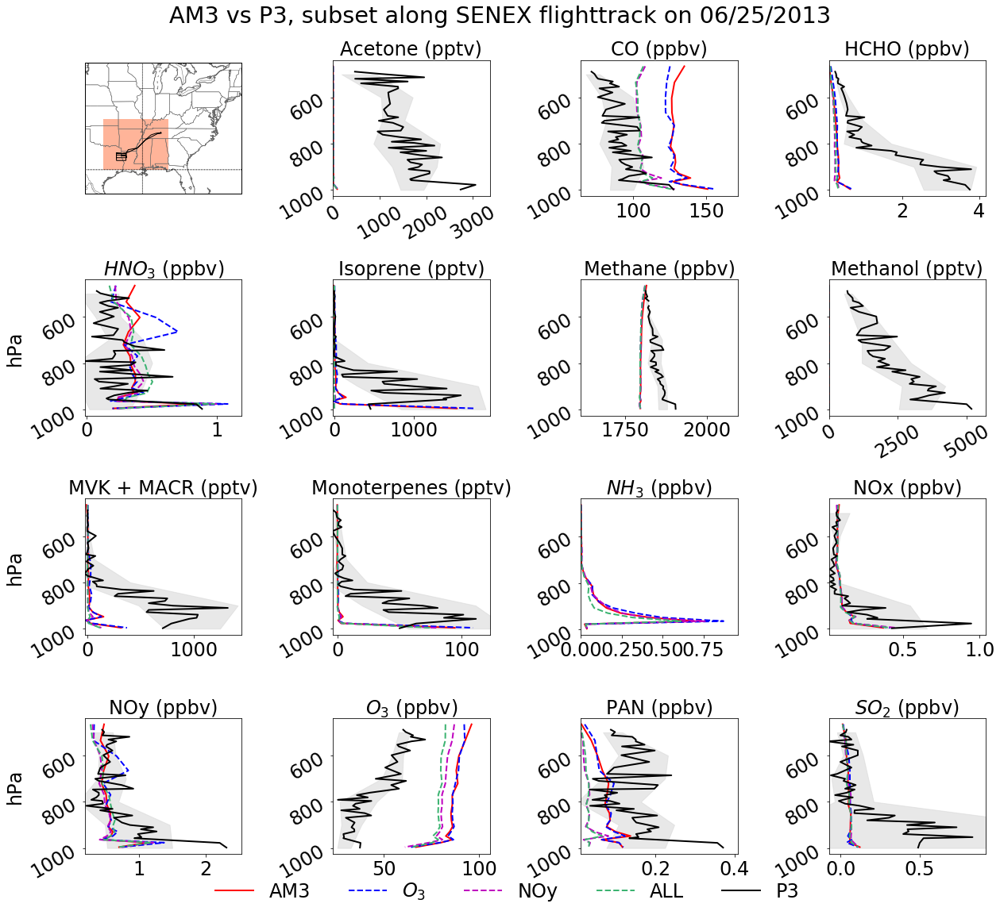

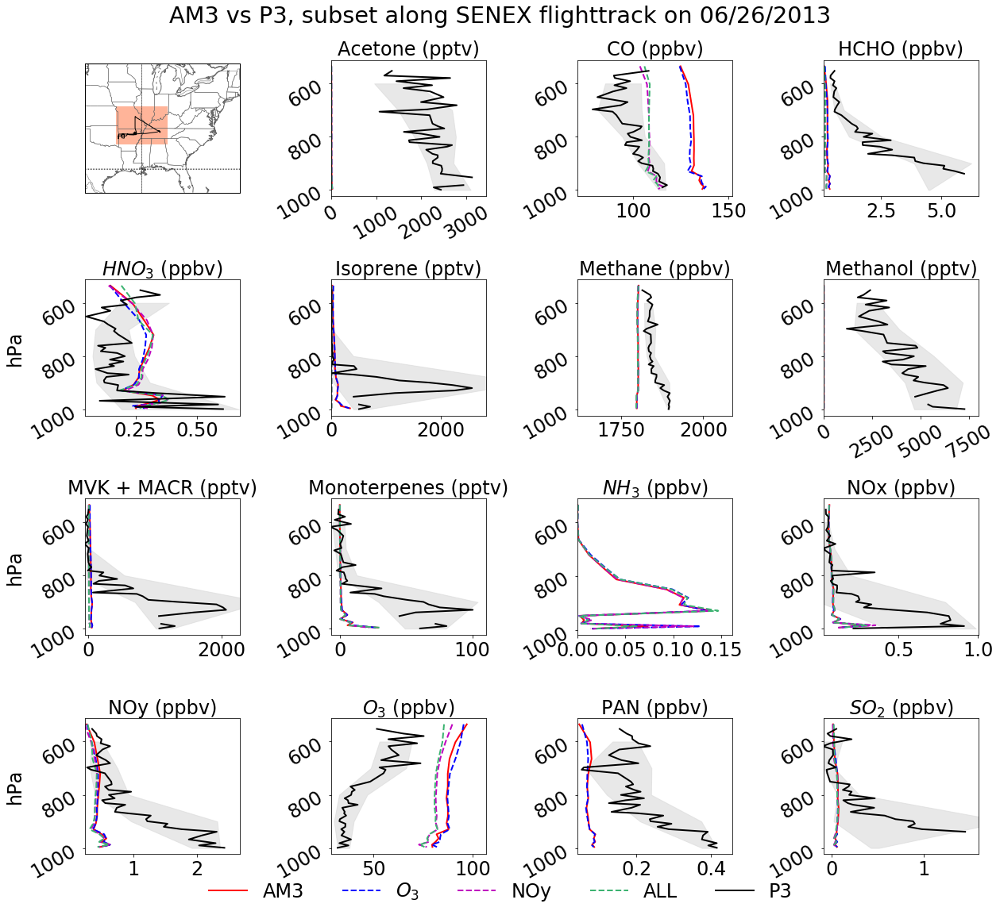

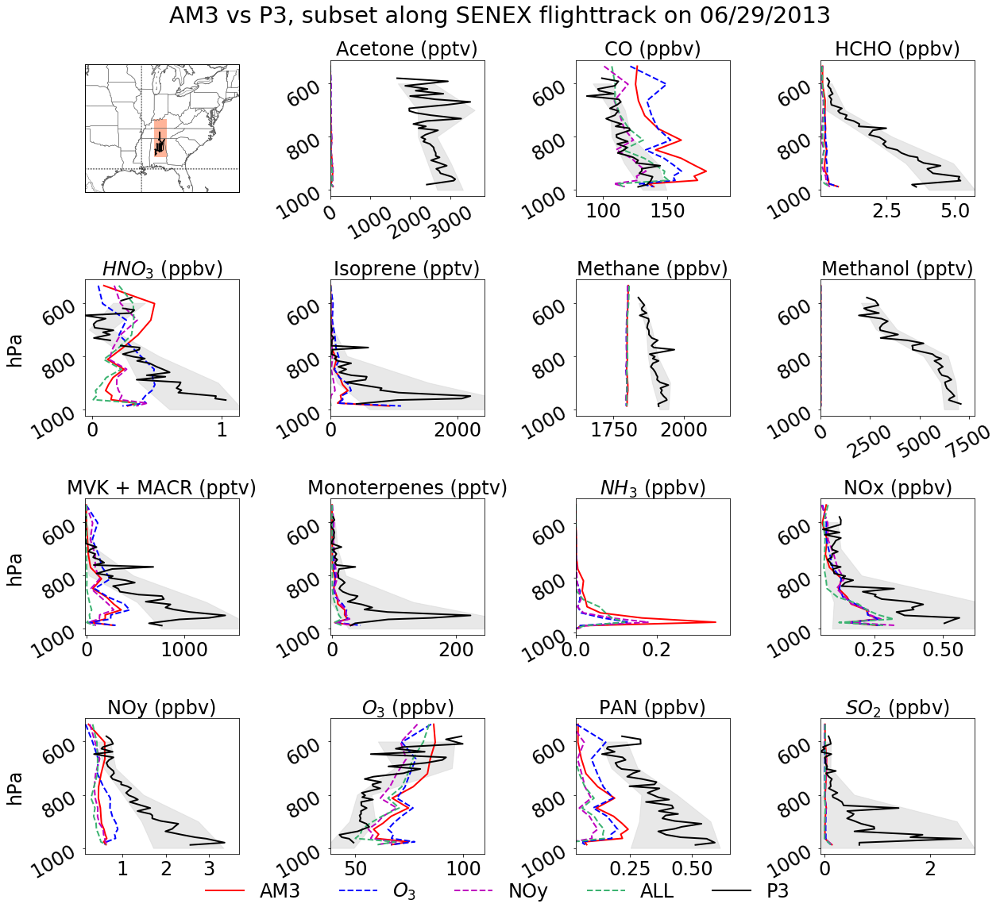

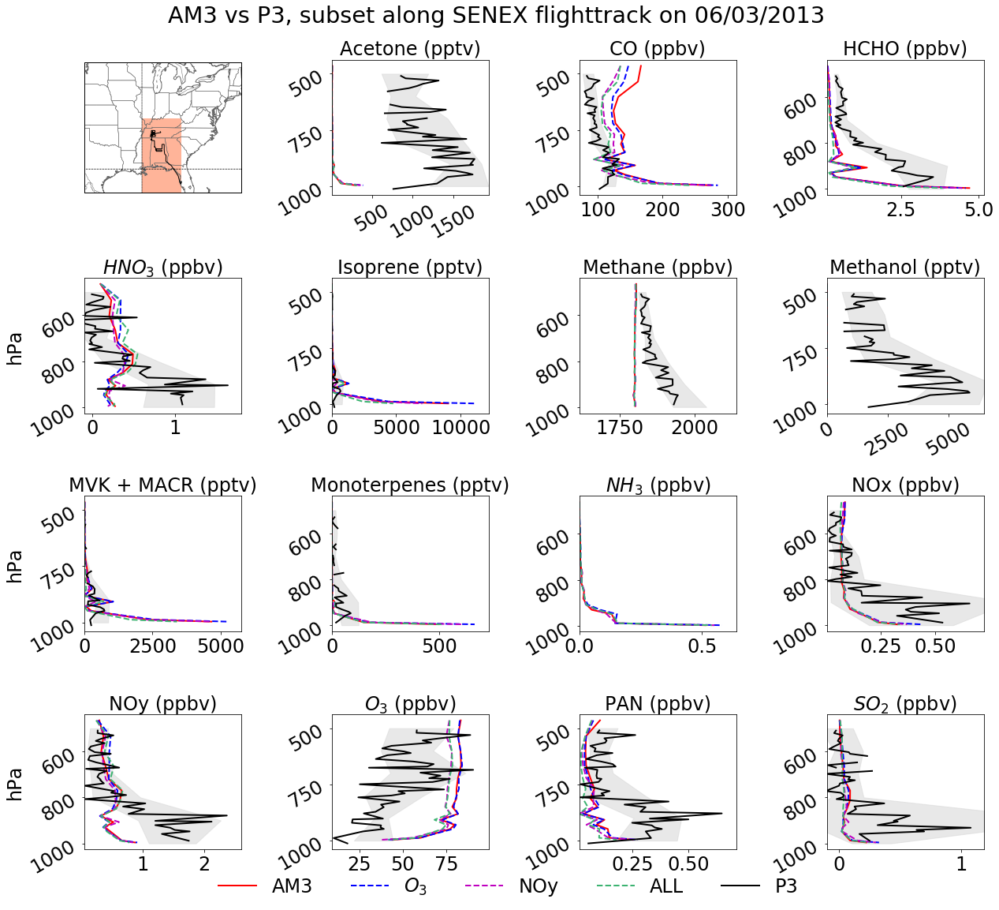

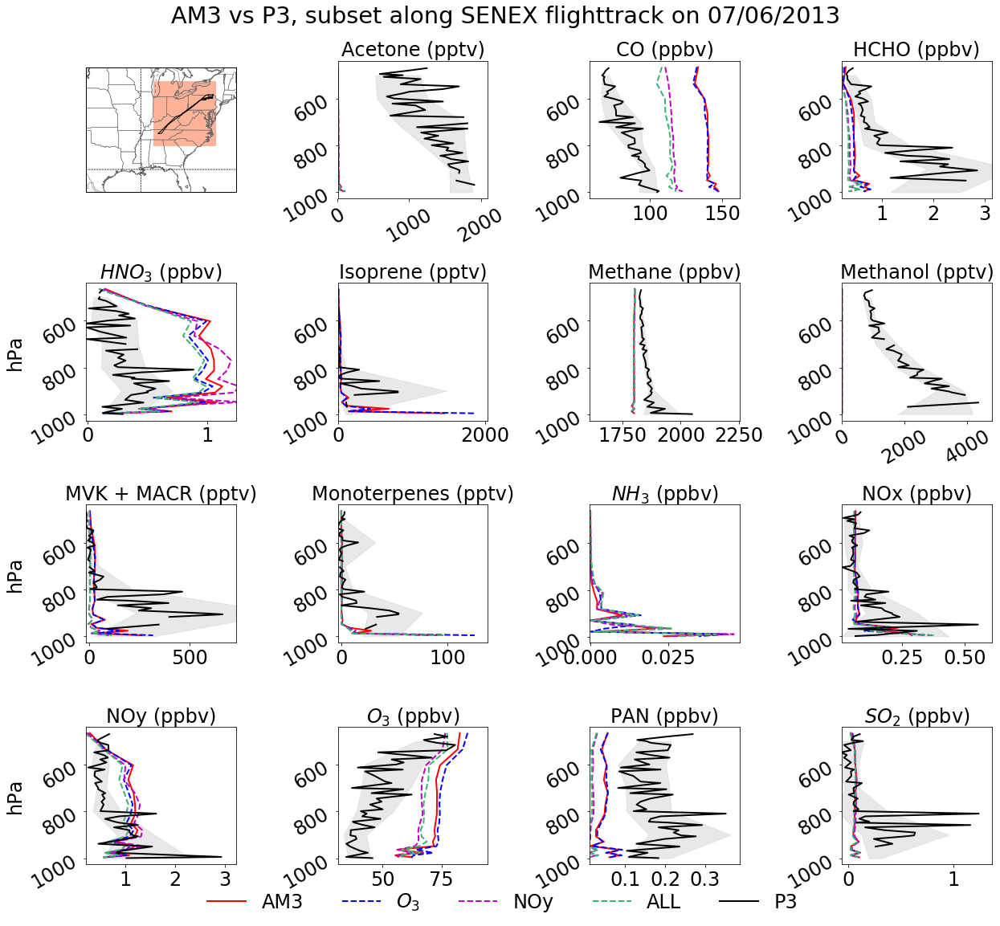

...

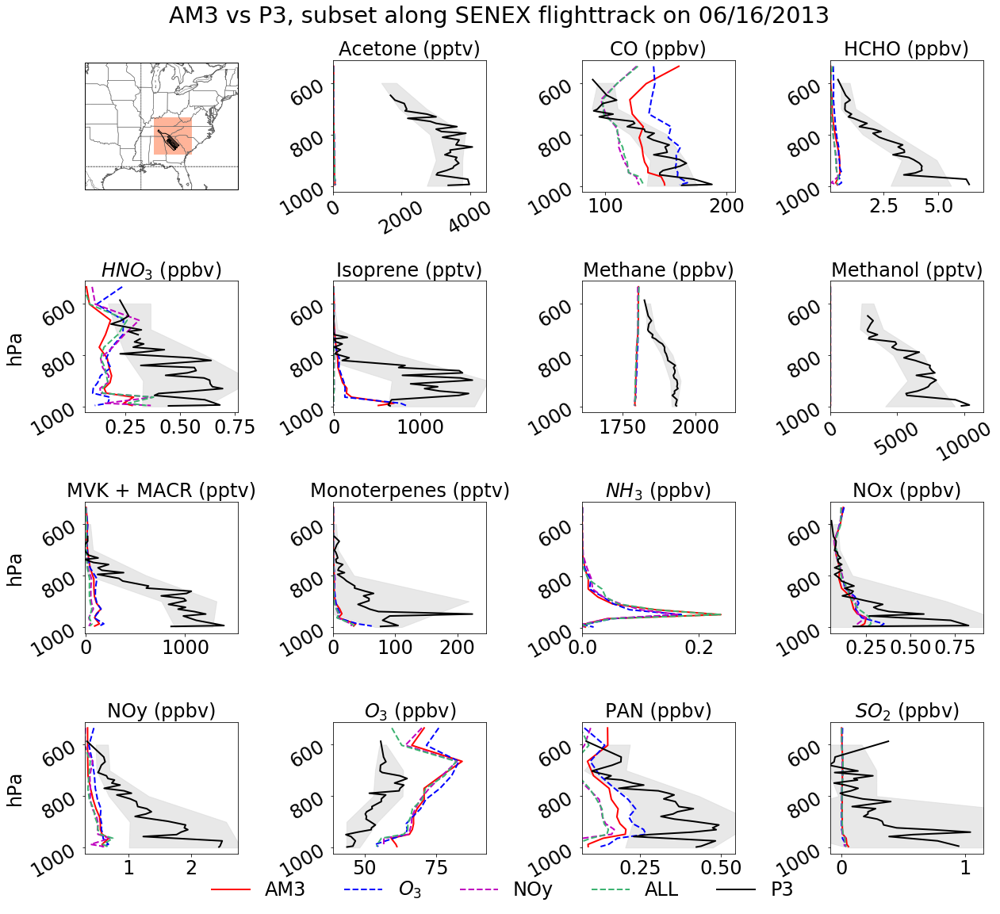

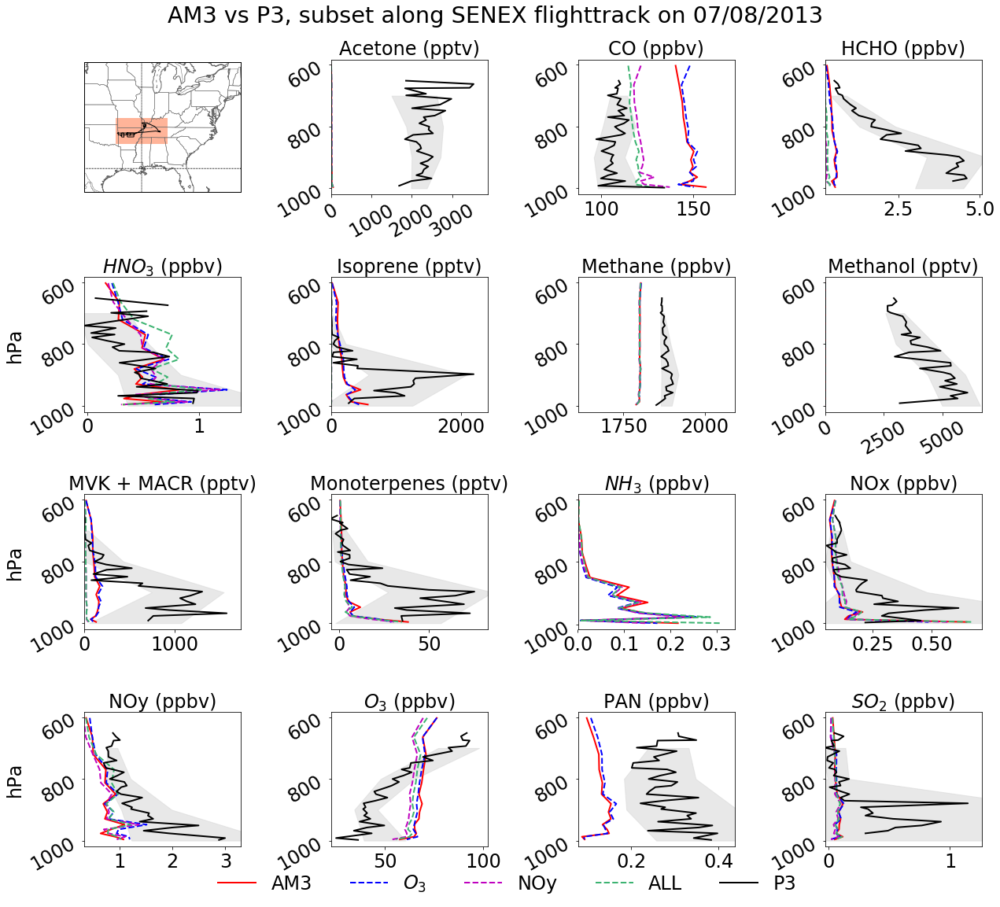

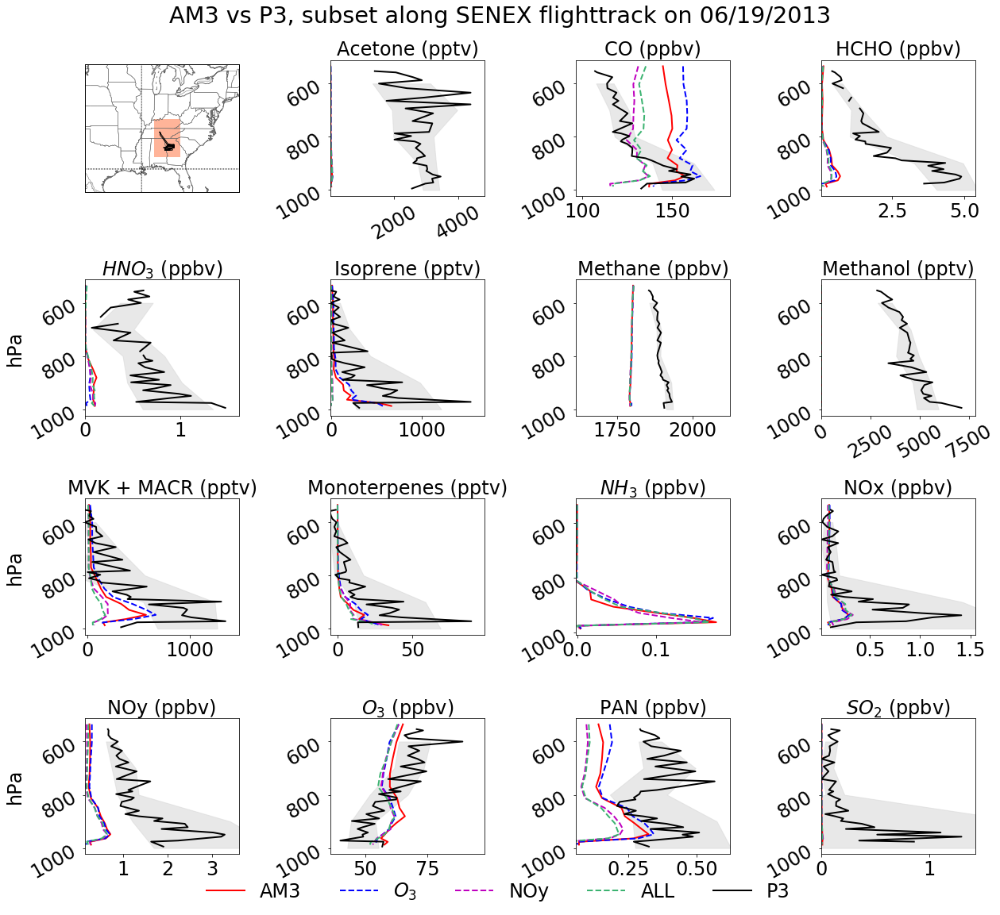

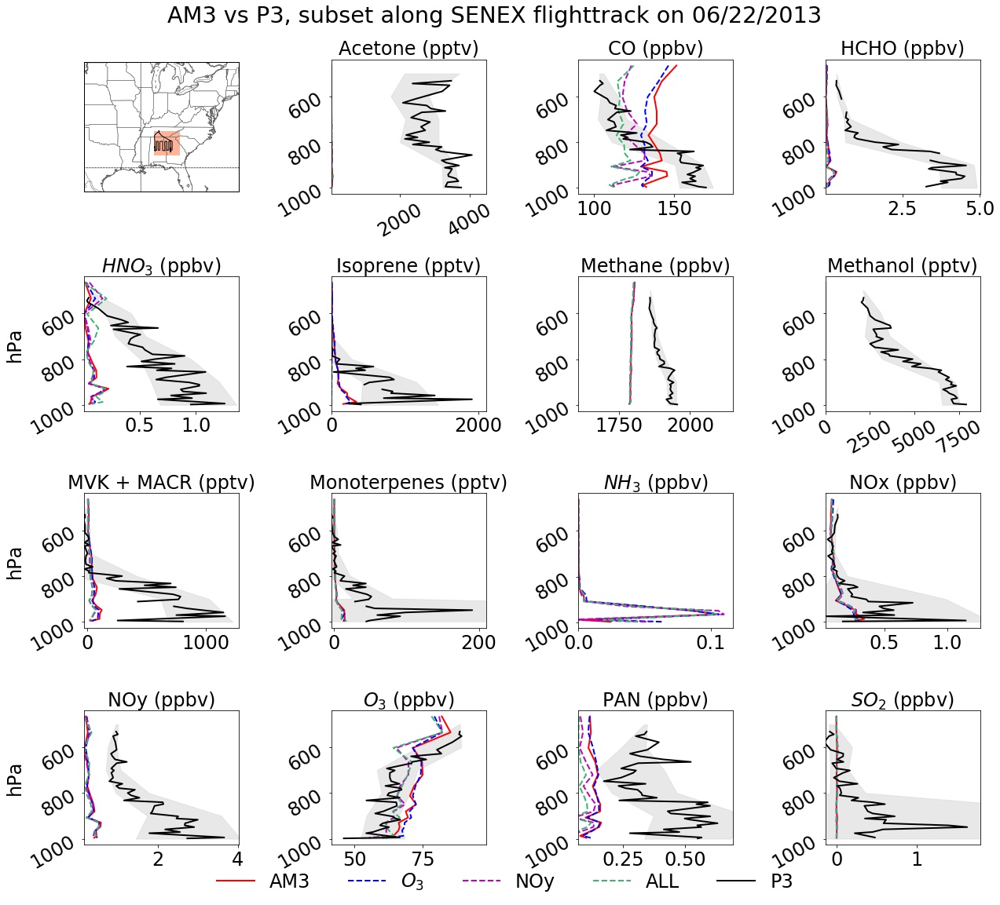

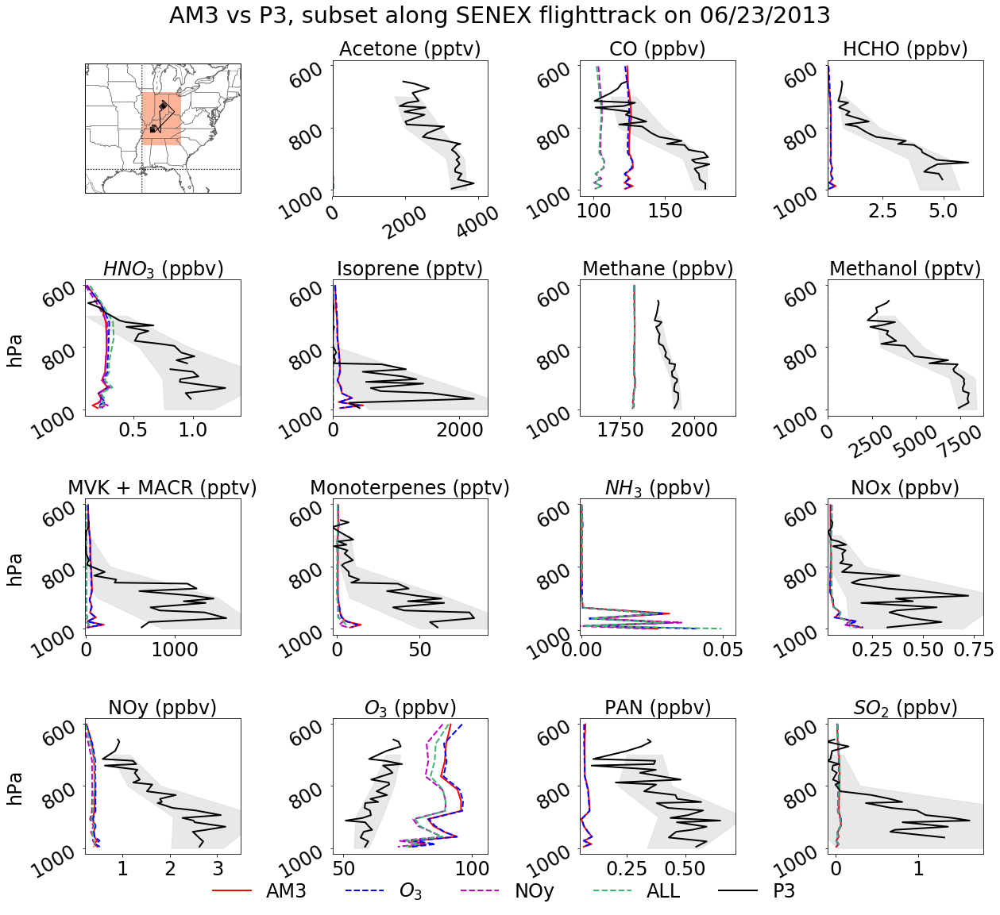

In [23]:
for dt in list(set(obs['DATE'])):
    date_vertprof(dt)

__Varying latitudes (all lons)__

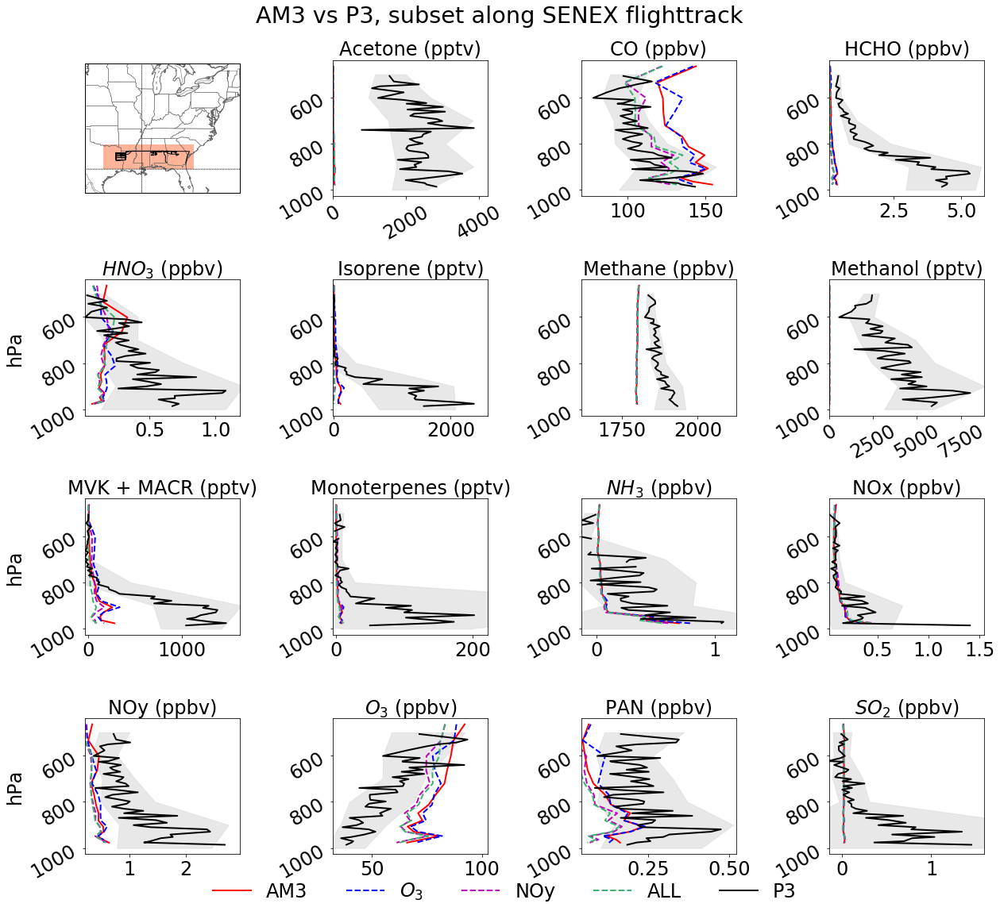

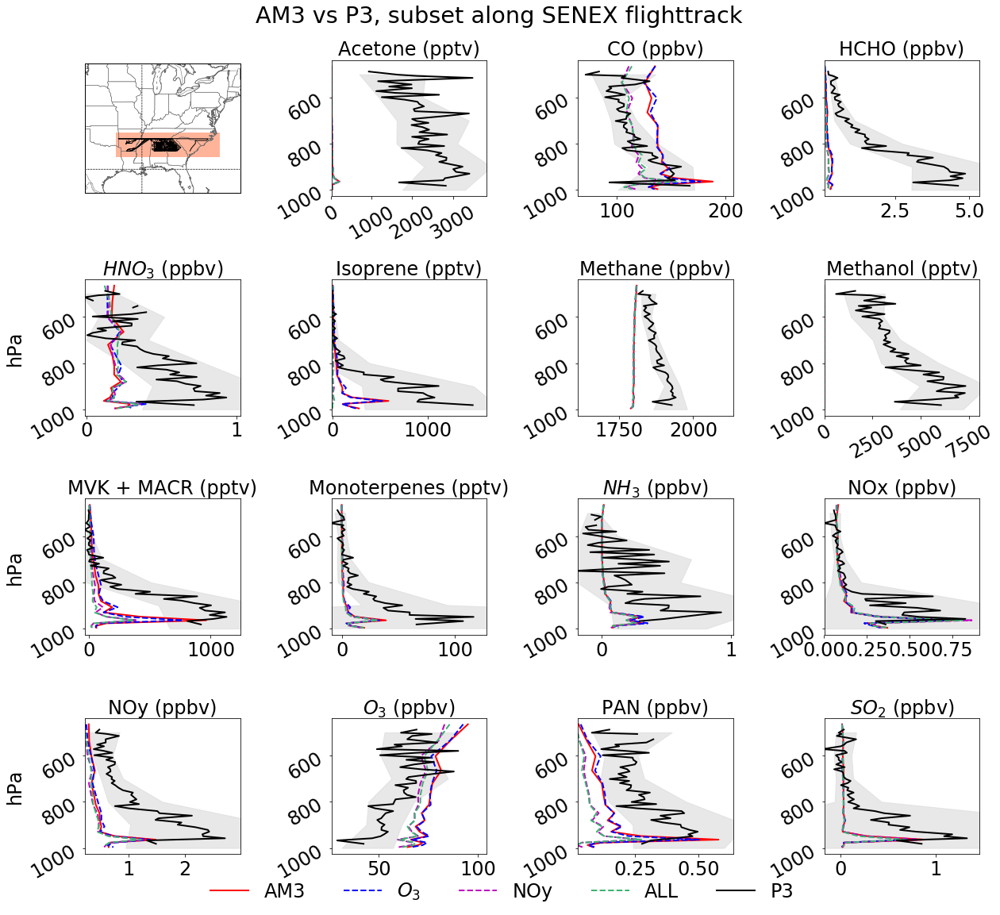

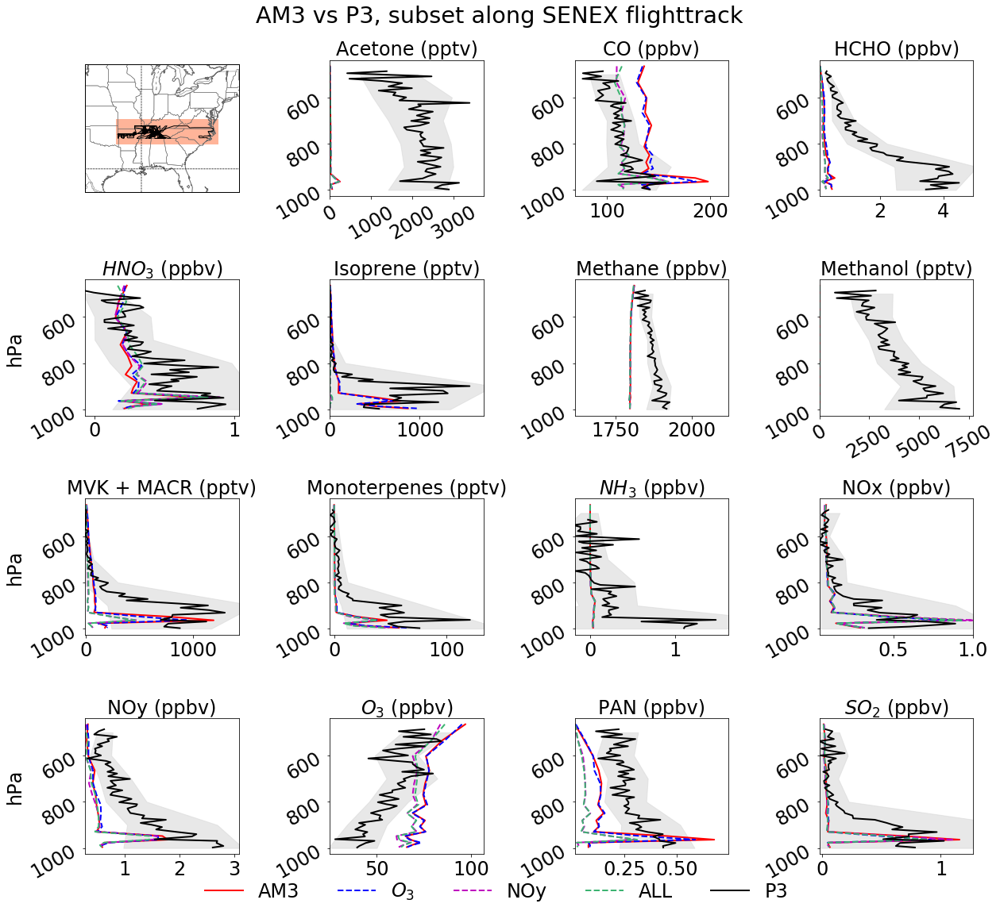

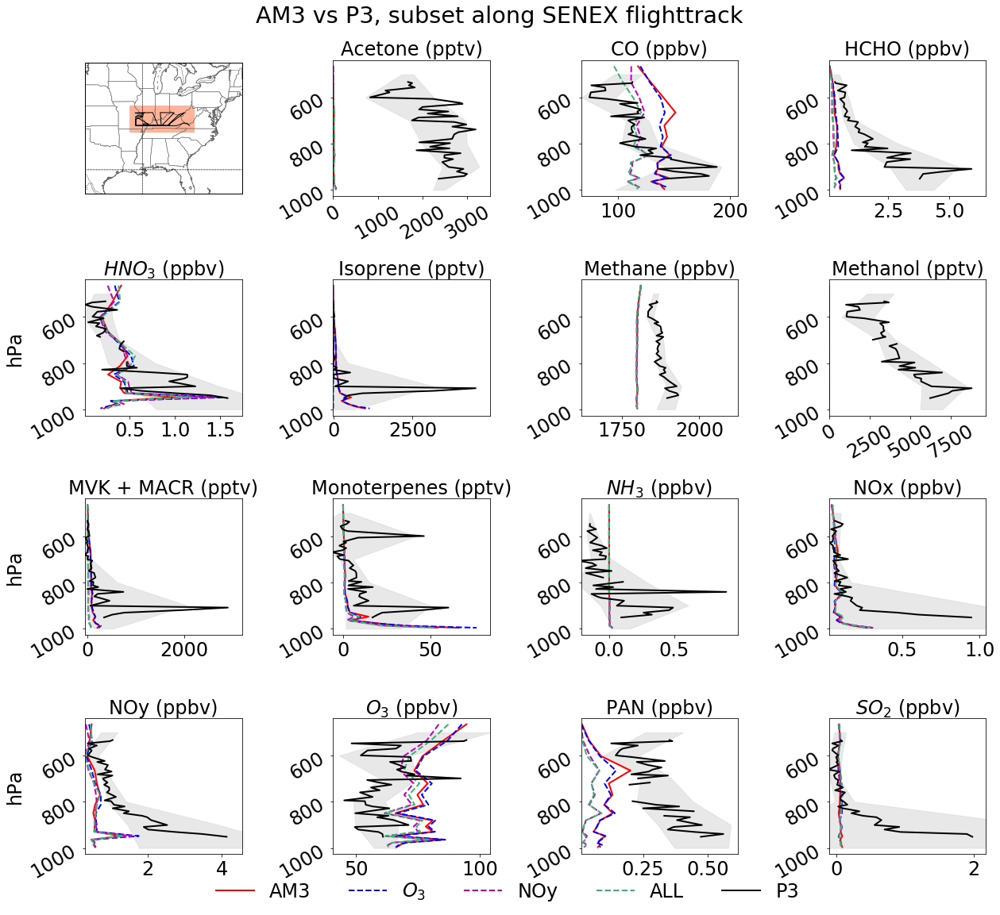

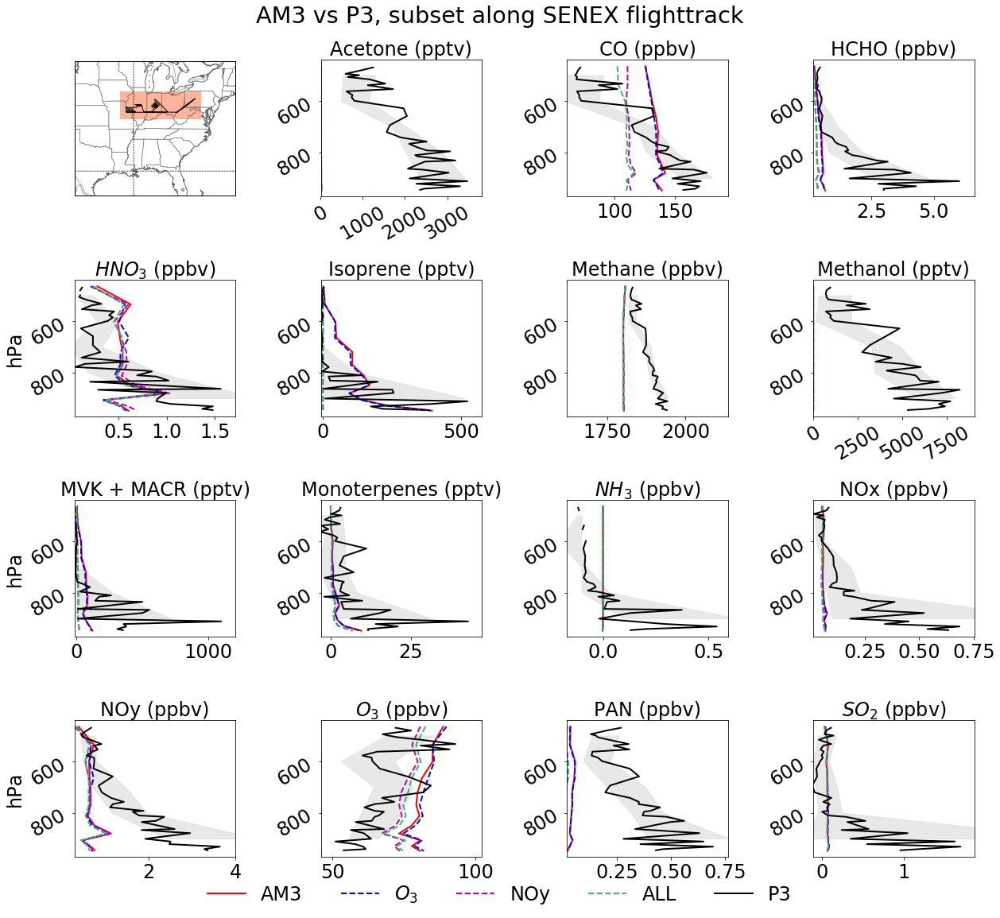

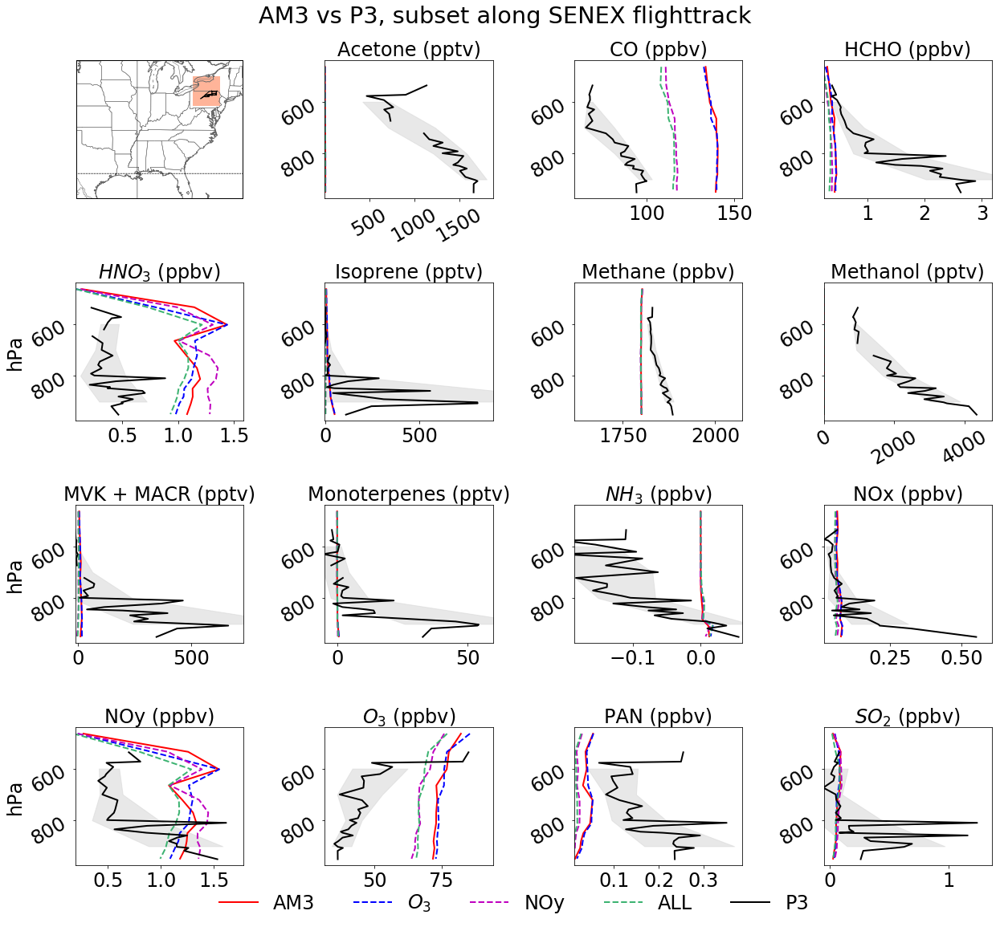

In [250]:
for cdix in np.arange(1,9):
    reg_vertprof(lats[cdix-1], lats[cdix], 'lat')

__Varying longitudes (all lats)__

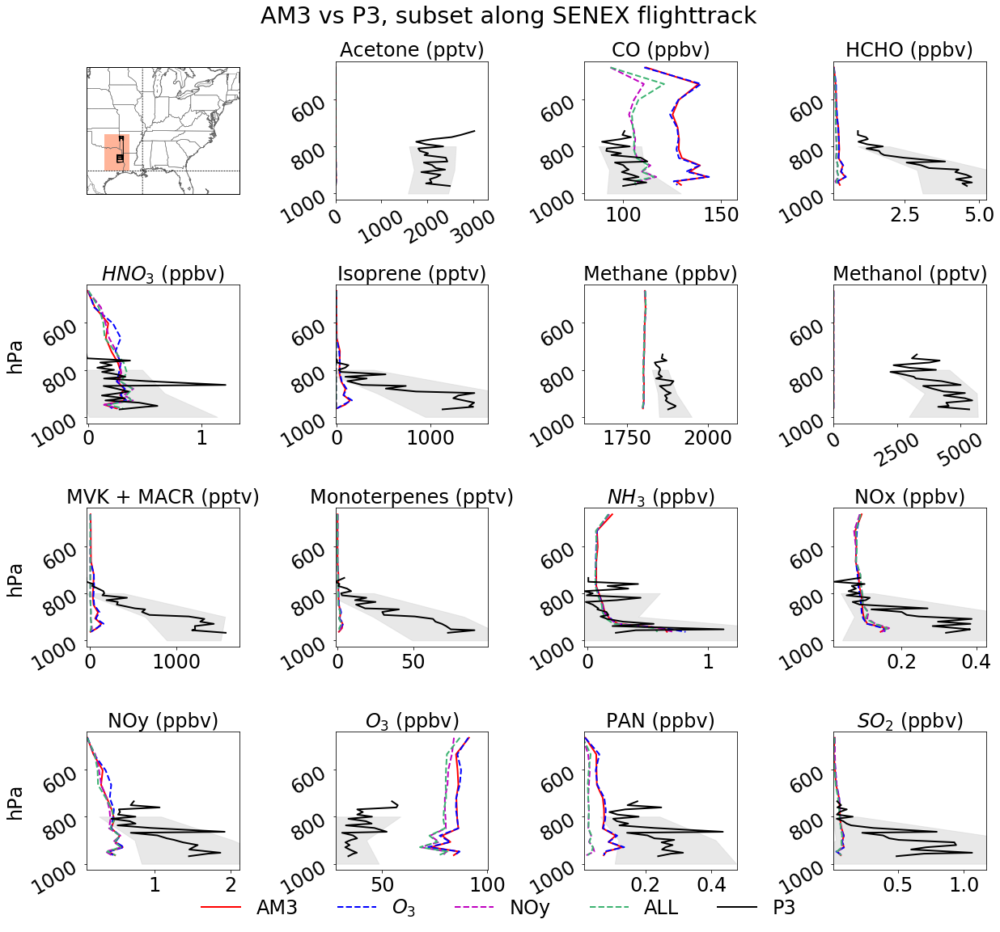

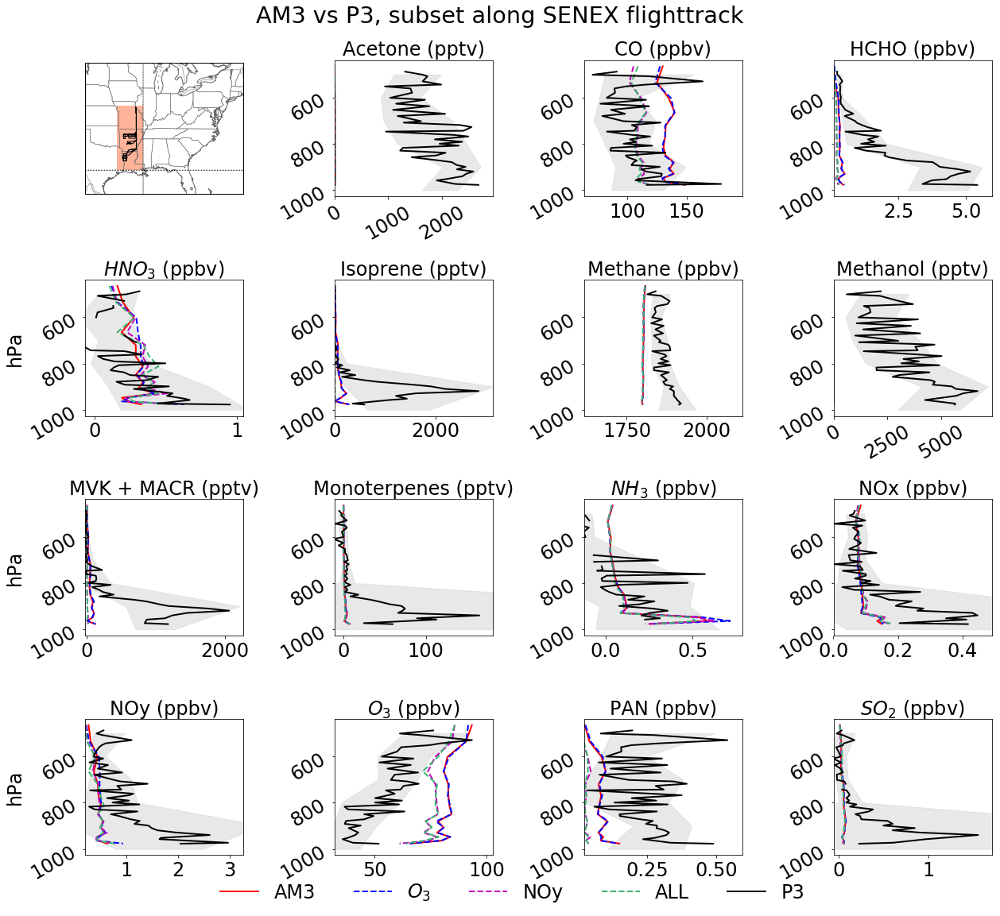

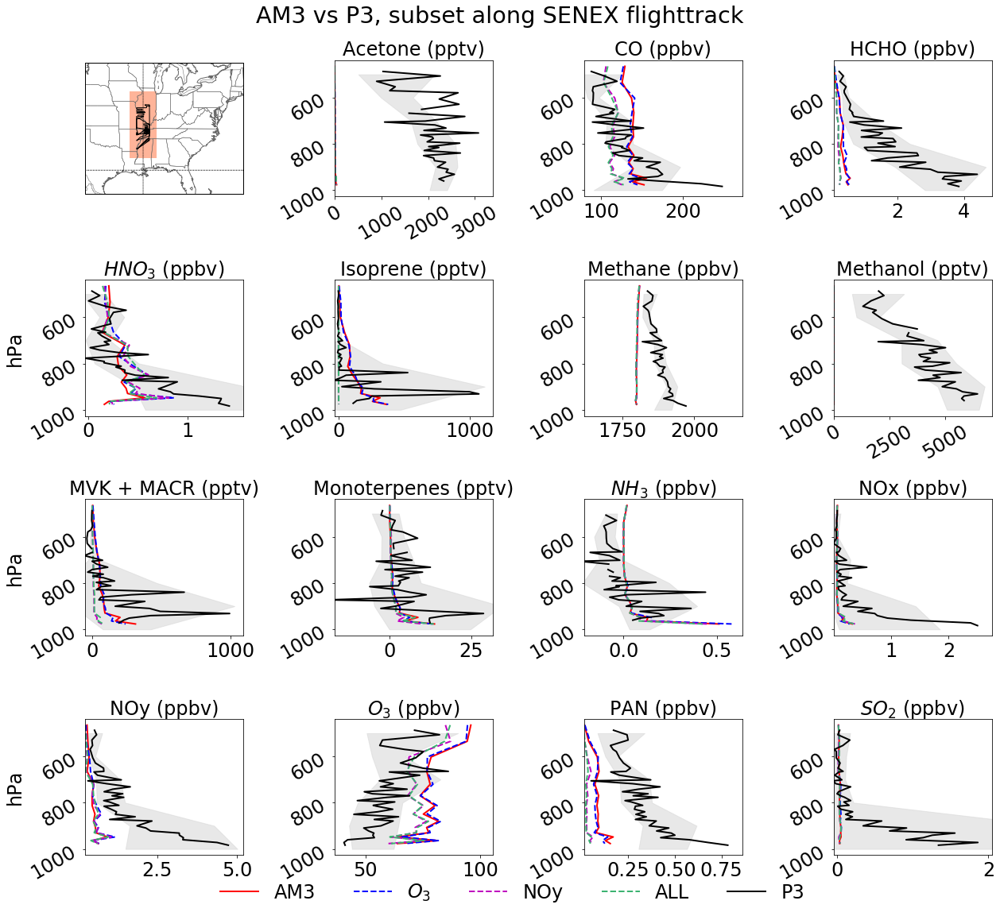

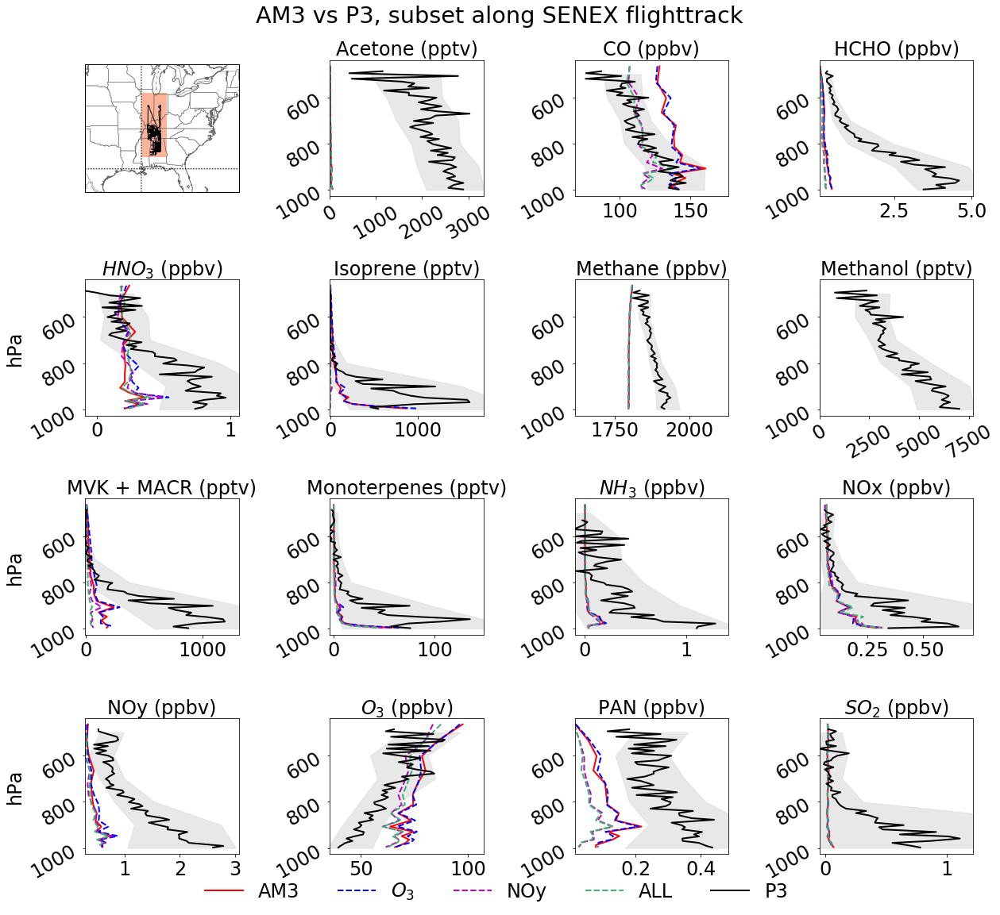

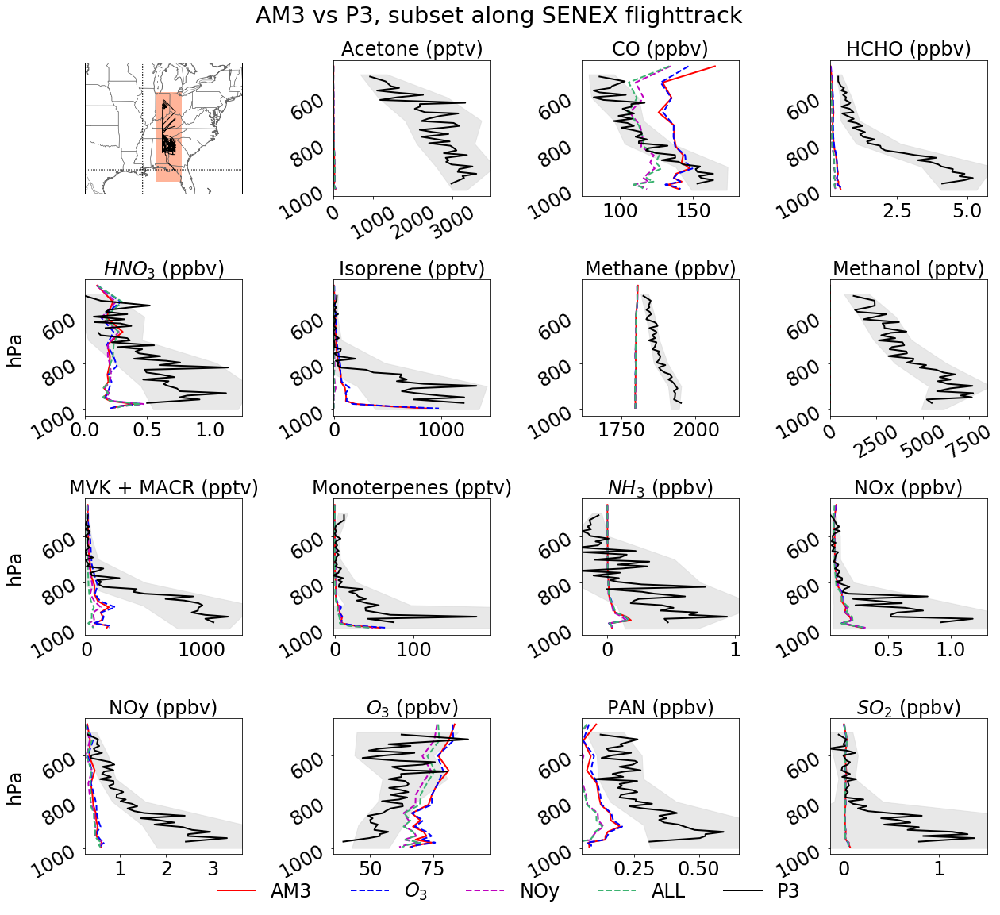

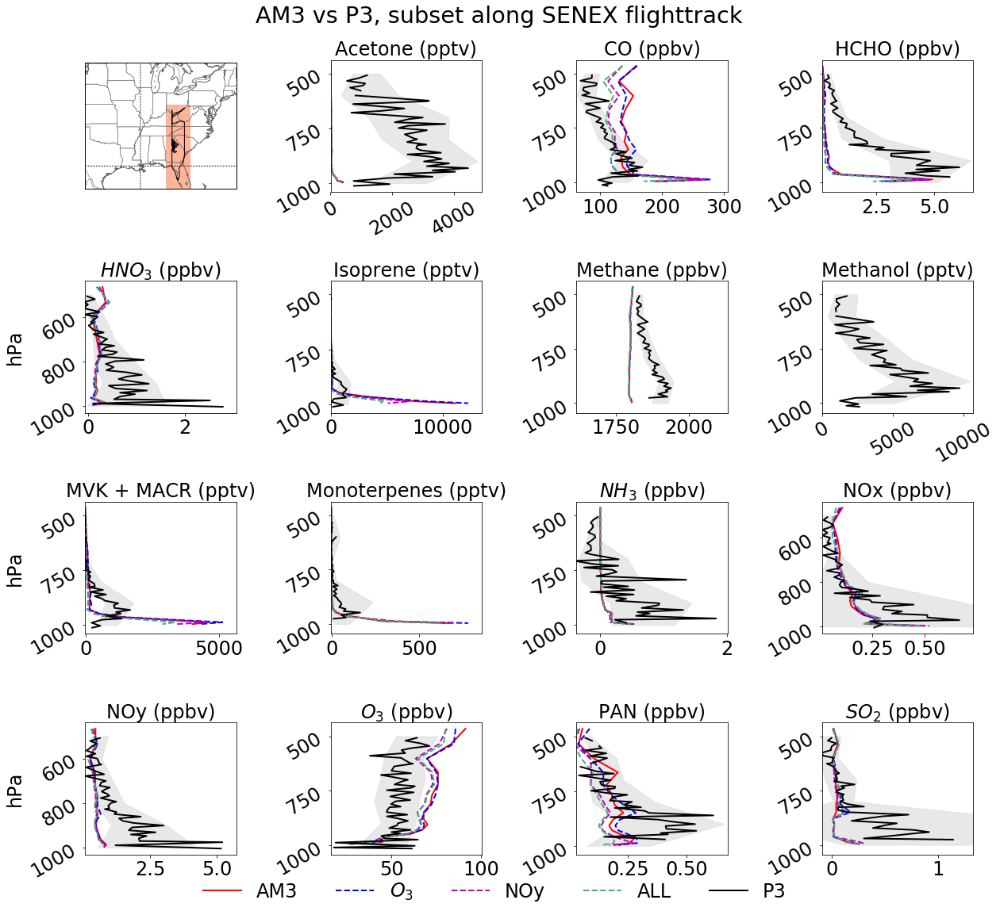

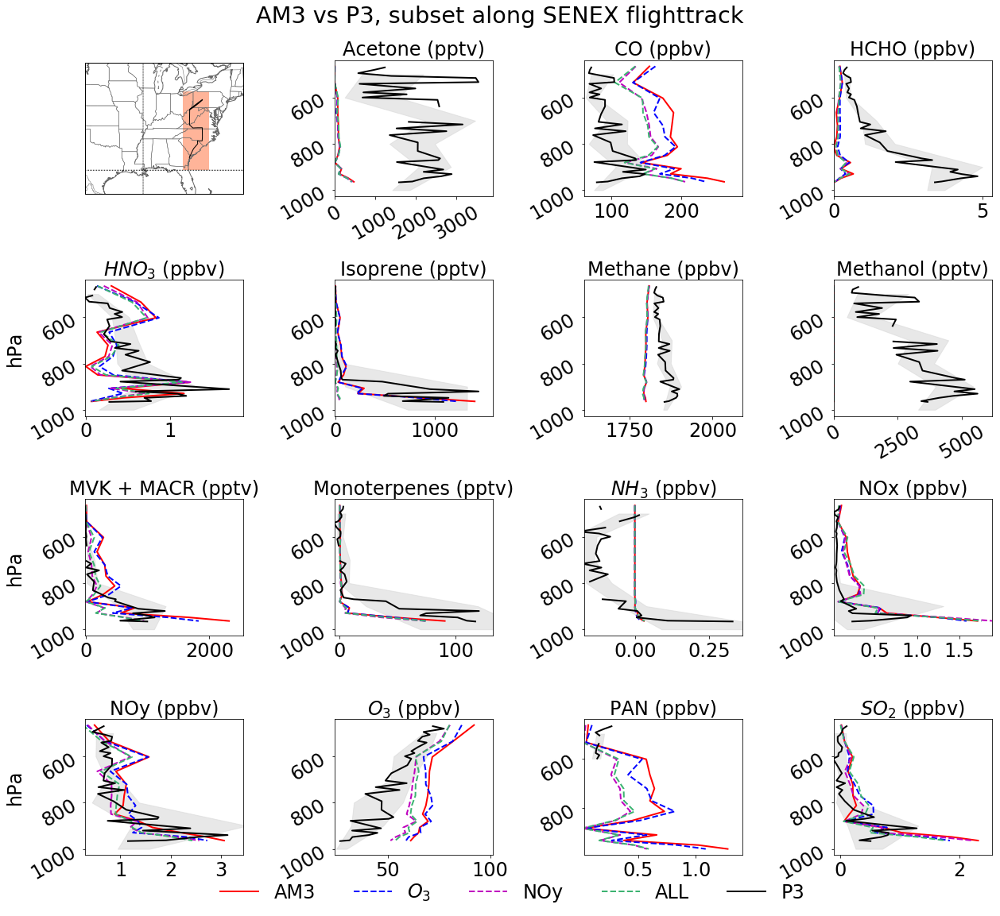

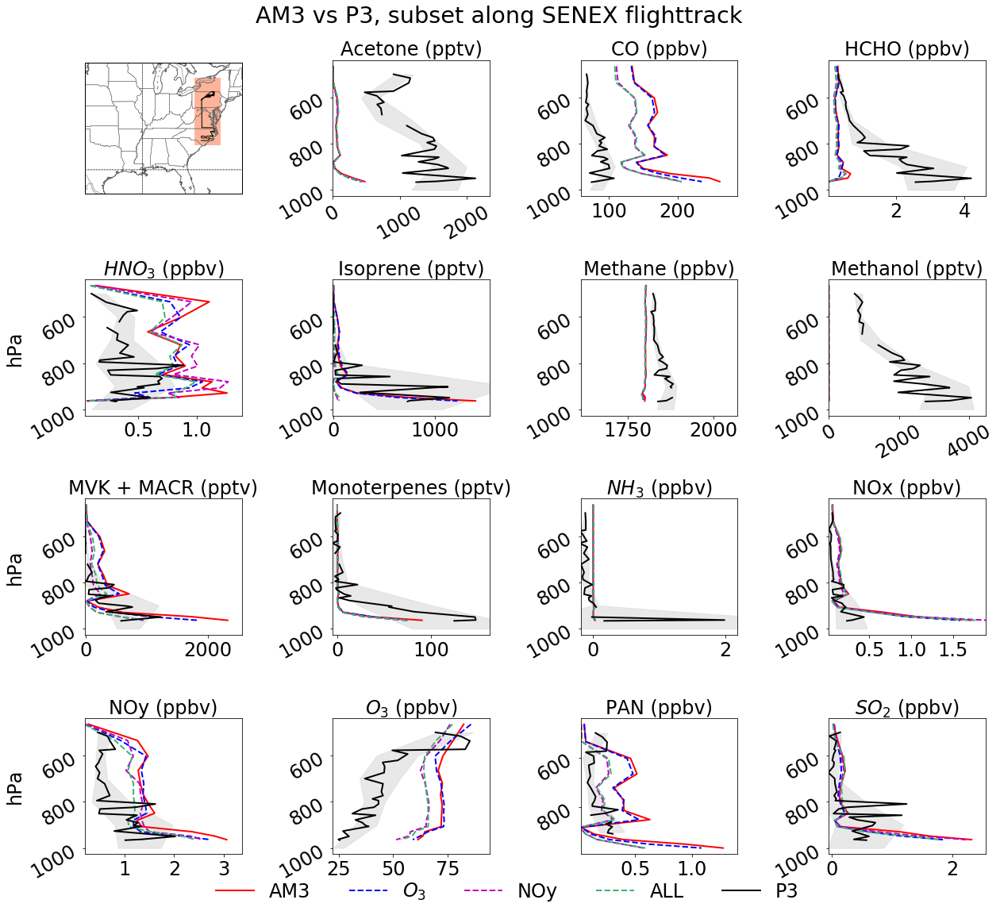

In [251]:
for cdix in np.arange(1, 9):
    reg_vertprof(lons[cdix-1], lons[cdix], 'lon')

# Model vs observations at each point

The model consistently underestimates several species (subjectively determined: monoterpenes, methane, methanol, acetone, formaldehyde and $SO_2$) across regions/flight dates. Moving forward toward a more detailed analysis, these will all be excluded except for $SO_2$, which is an interesting pollutant from a dry deposition perspective.

In [15]:
short_pol = collections.OrderedDict()
short_pol['CO'] = ['CO_PPBV', 'CO']
short_pol['HNO3'] = ['HNO3_PPBV', r'$HNO_3$']
short_pol['ISOP'] = ['ISOPRENE_PPTV', 'Isoprene']
short_pol['MVK_MACR'] = ['MVK_MACR_PPTV', 'MVK + MACR']
short_pol['NOx'] = ['NOx', 'NOx']
short_pol['NOy'] = ['NOY_PPBV', 'NOy']
short_pol['O3'] = ['O3_PPBV', r'$O_3$']
short_pol['PAN'] = ['PAN_PPBV', 'PAN']
short_pol['SO2'] = ['SO2_PPBV', r'$SO_2$']
short_pol['NH3'] = ['NH3_PPBV', r'$NH_3$']

In [19]:
def mod_obs(date):
    obp = obs[obs['DATE']==date]
    if date>=20130701:
        bsp = base[base['TIME']>=1277.]
        bsp = bsp[bsp['TIME'] - obp['DOY'] - 1276. < 1]
        ozp = ozoff[ozoff['TIME']>=1277.]
        ozp = ozp[ozp['TIME'] - obp['DOY'] - 1276. < 1]
        nyp = nyoff[nyoff['TIME']>=1277.]
        nyp = nyp[nyp['TIME'] - obp['DOY'] - 1276. < 1]
        alp = aloff[aloff['TIME']>=1277.]
        alp = alp[alp['TIME'] - obp['DOY'] - 1276. < 1]
    else:
        bsp = base[base['TIME']<1277.]
        bsp = bsp[bsp['TIME'] - obp['DOY'] - 1246. < 1]
        ozp = ozoff[ozoff['TIME']<1277.]
        ozp = ozp[ozp['TIME'] - obp['DOY'] - 1246. < 1]
        nyp = nyoff[nyoff['TIME']<1277.]
        nyp = nyp[nyp['TIME'] - obp['DOY'] - 1246. < 1]
        alp = aloff[aloff['TIME']<1277.]
        alp = alp[alp['TIME'] - obp['DOY'] - 1246. < 1]
        
    if np.isnan(np.mean(obp['NH3_PPBV']))==True:
        fig = plt.figure(figsize=[14,16])
        ax = fig.add_subplot(5, 2, 1)
    else:
        fig = plt.figure(figsize=[18,16])
        ax = fig.add_subplot(4, 3, 1)
    lats = [bsp['LAT'].min()-1., bsp['LAT'].max()+1.]
    lons = [bsp['LON'].min()-180.-1.25, bsp['LON'].max()-180.+1.25]
    bmap = getNEmap(ax)
    x, y = bmap(obp['GPSLON'].values, obp['GPSLAT'].values)
    draw_screen_poly(lats, lons, bmap, 'orangered')
    bmap.plot(x, y, c='k', linewidth=1)
    
    for idx, p in enumerate(short_pol):
        if np.isnan(np.mean(obp['NH3_PPBV']))==True:
            if p=='NH3':
                continue
            else:
                ax = fig.add_subplot(5, 2, idx+2)
                if (idx+1)%2==0:
                    plt.ylabel('Model (AM3)')
                if idx>6:
                    plt.xlabel('Obs (SENEX)')
        else:
            ax = fig.add_subplot(4, 3, idx+2)
            if (idx+1)%3==0:
                plt.ylabel('Model (AM3)')
            if idx>7:
                plt.xlabel('Obs (SENEX)')
        obv = np.ma.masked_invalid(obp[short_pol[p][0]])
        plt.scatter(obv, bsp[p], c='r', s=1, label='Base')
        plt.scatter(obv, ozp[p], c='b', s=1, label='$O_3$')
        plt.scatter(obv, nyp[p], c='m', s=1, label='NOy')
        plt.scatter(obv, alp[p], c='mediumseagreen', s=1, label='ALL')
        lim_min = np.min([np.min(bsp[p]), np.min(ozp[p]), np.min(obv)])
        lim_max = np.max([np.max(bsp[p]), np.max(ozp[p]), np.max(obv)])
        plt.xlim([lim_min, lim_max])
        plt.ylim([lim_min, lim_max])
        plt.plot([0, lim_max], [0, lim_max], c='k', linewidth=0.5)
        if idx==5:
            plt.legend(loc='upper left', frameon=False, fontsize=16, ncol=2)
        if p!='NOx':
            plt.title(short_pol[p][1] + ' (' + short_pol[p][0][-4:].lower() + ')')
        else:
            plt.title(short_pol[p][1] + ' (ppbv)')
    plt.suptitle('AM3 vs P3, subset along SENEX flighttrack on ' + str(date)[-4:-2] + '/' + str(date)[-2:] + '/' + str(date)[0:4])        
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.savefig('mod_obs/flight_' + str(date) + '.jpg')

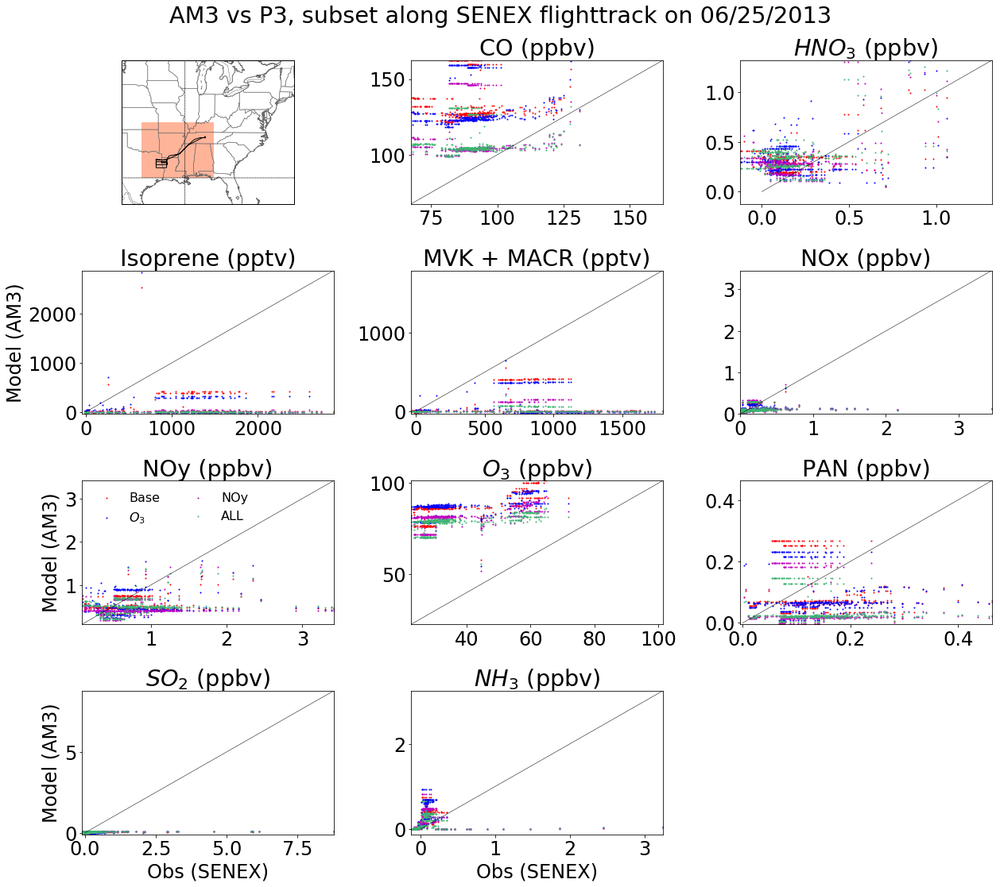

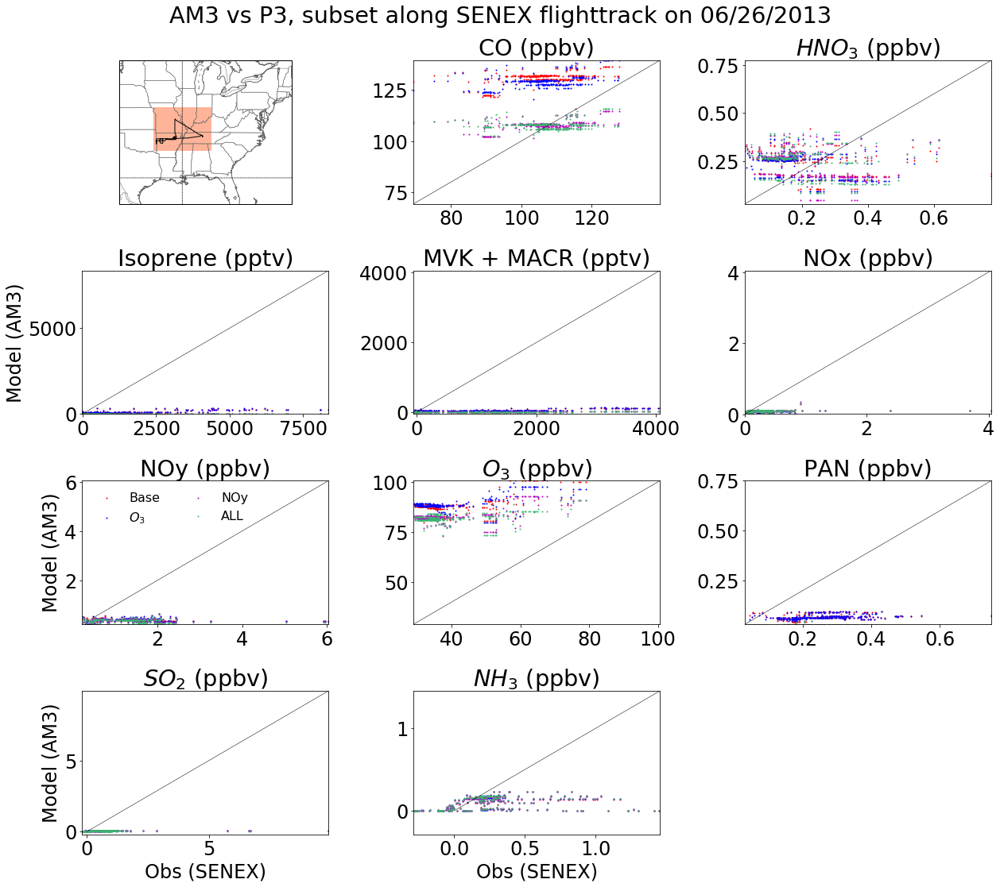

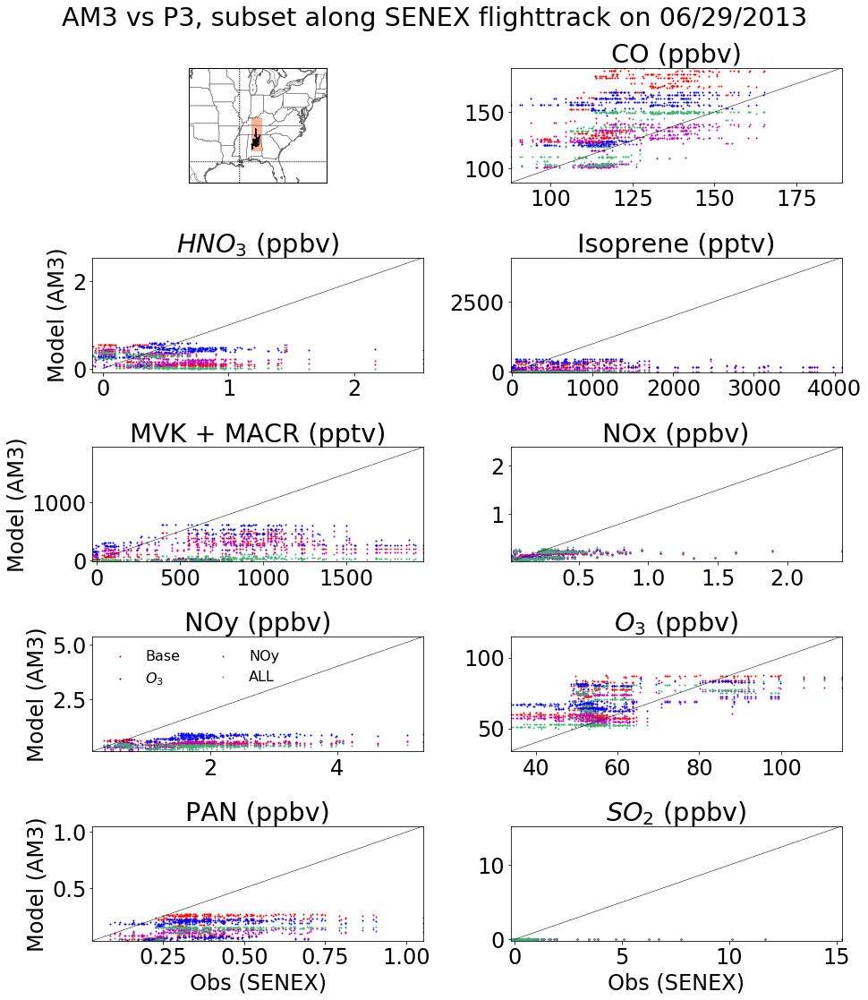

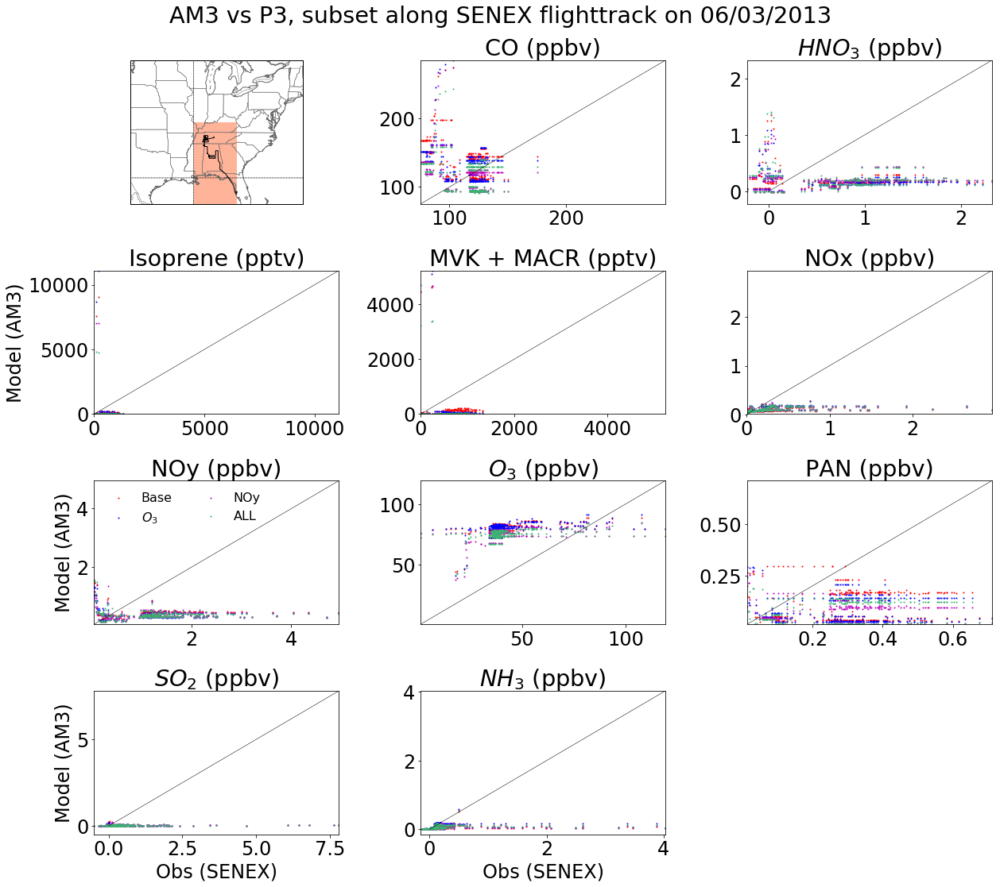

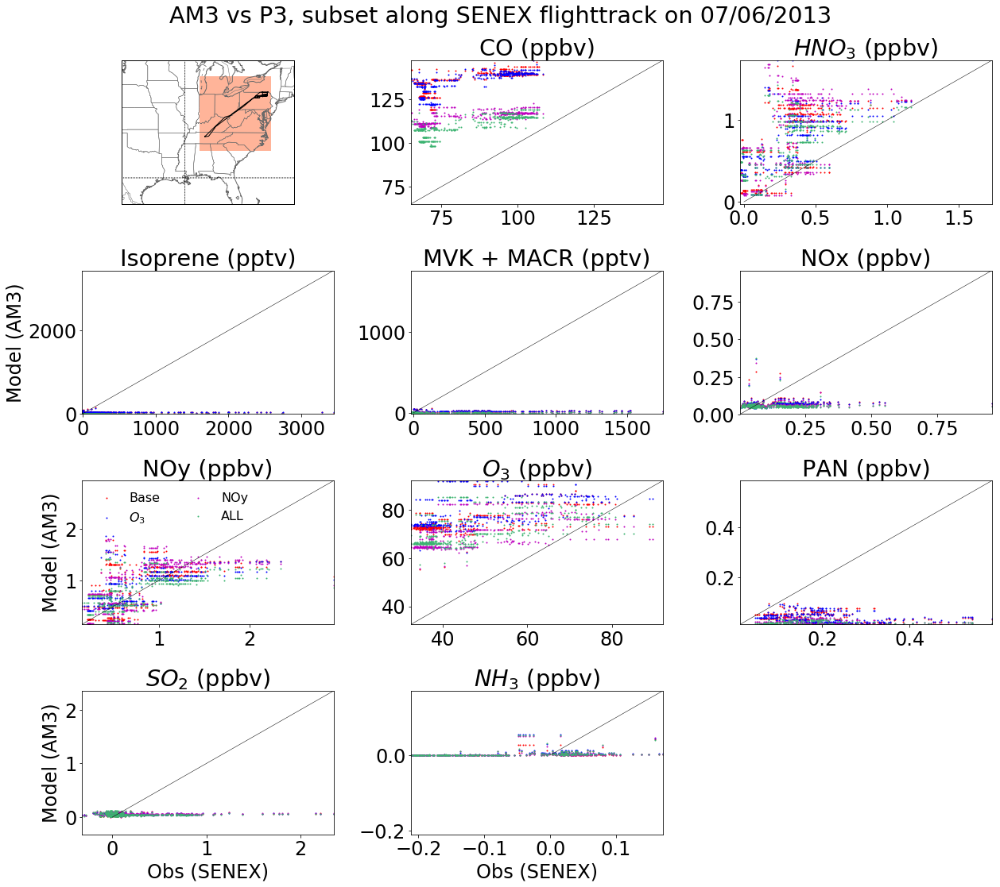

...

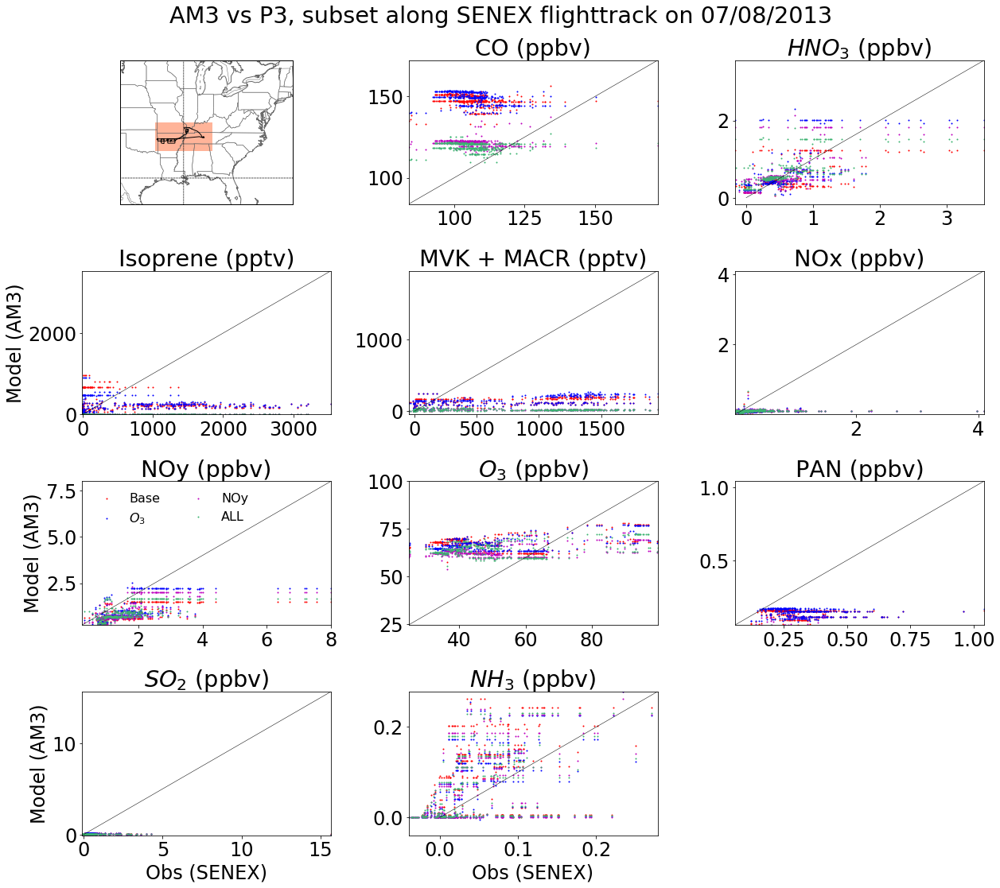

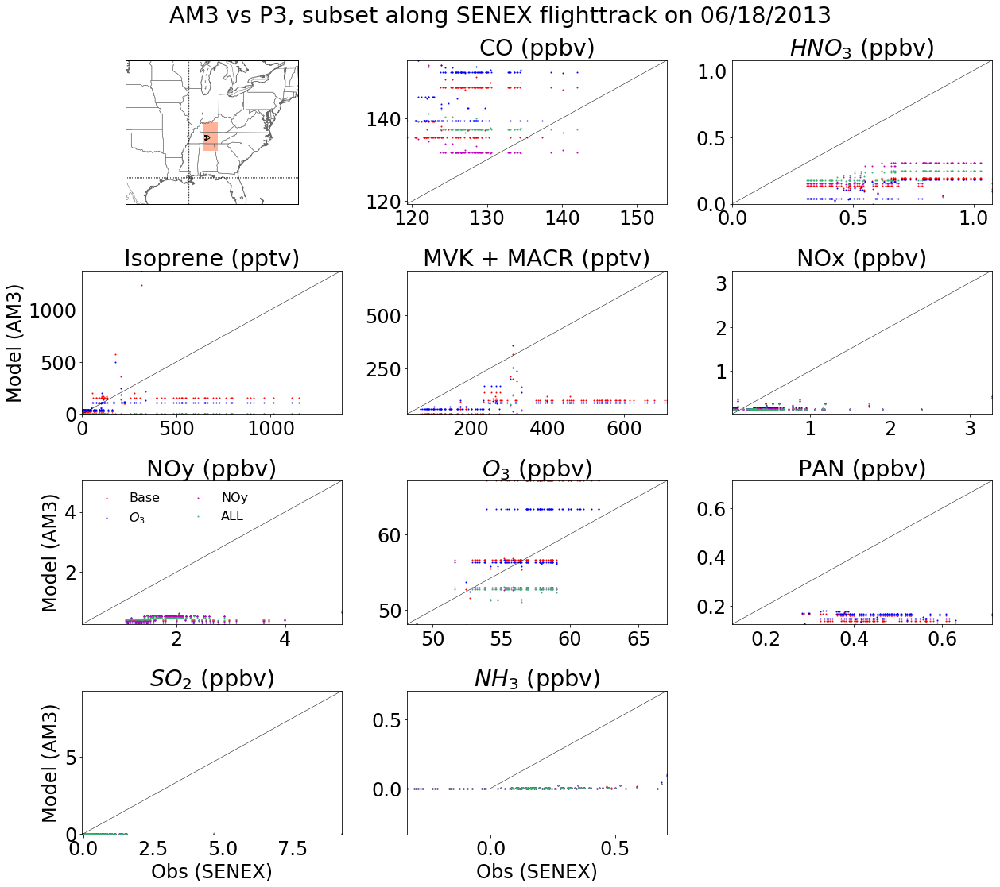

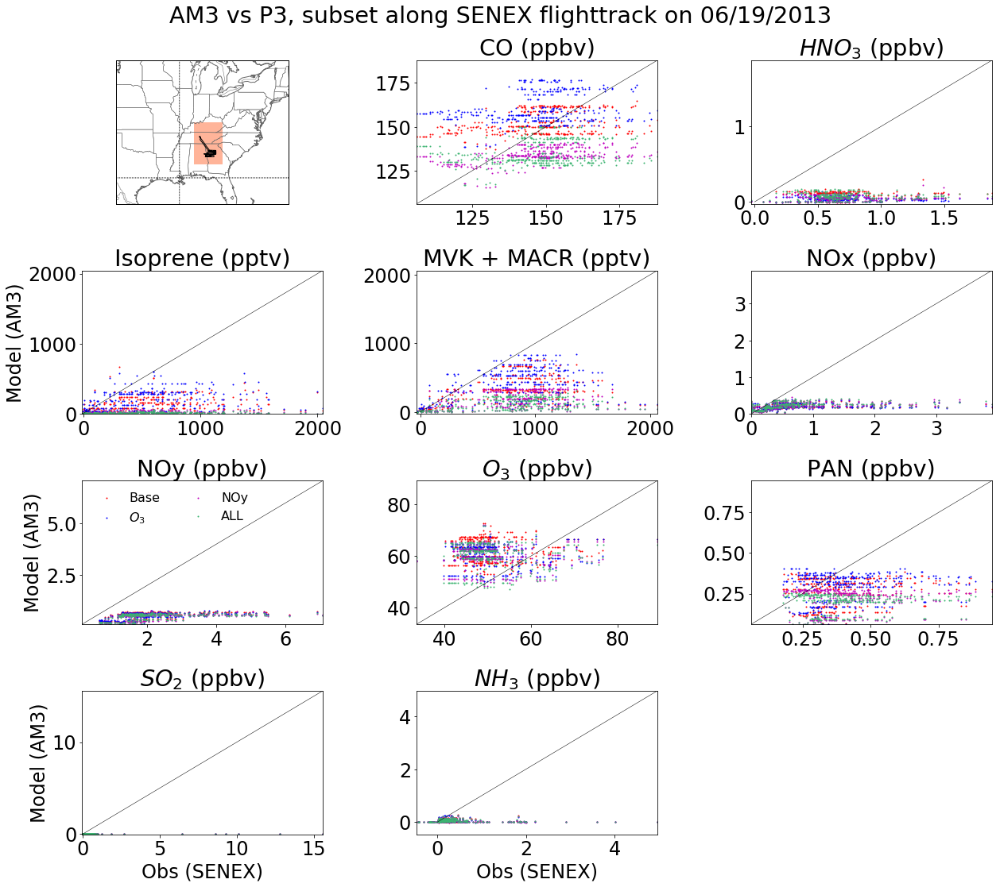

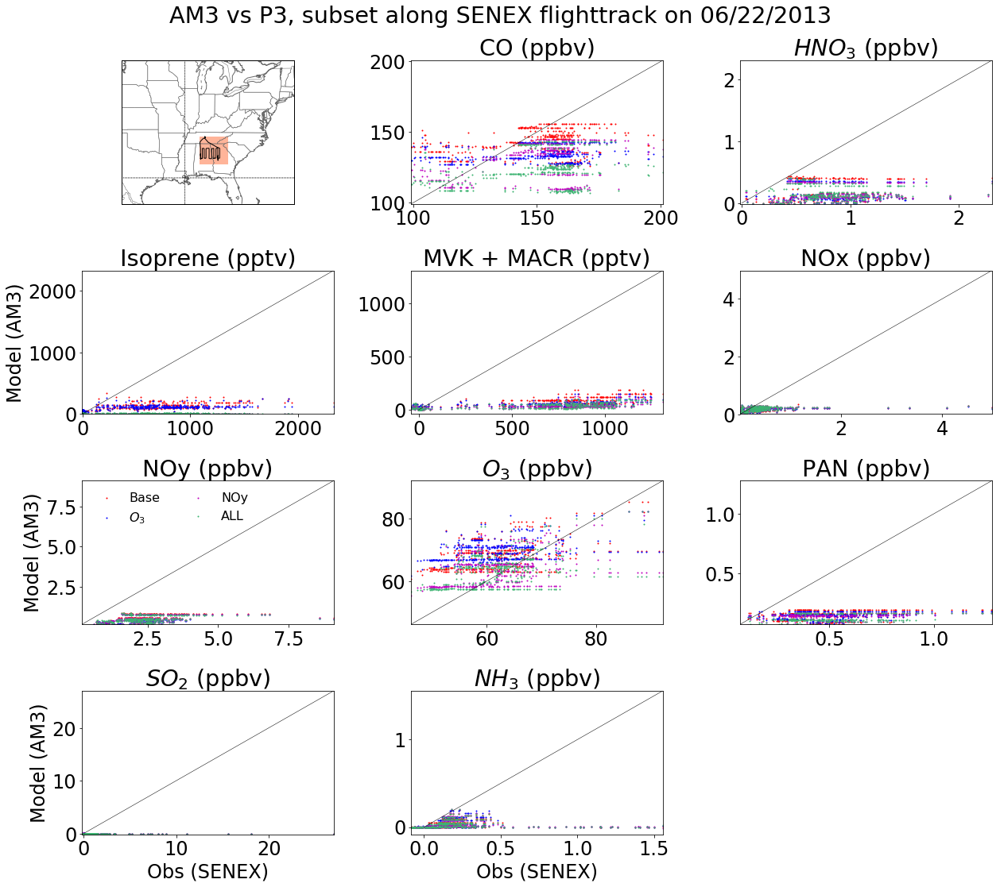

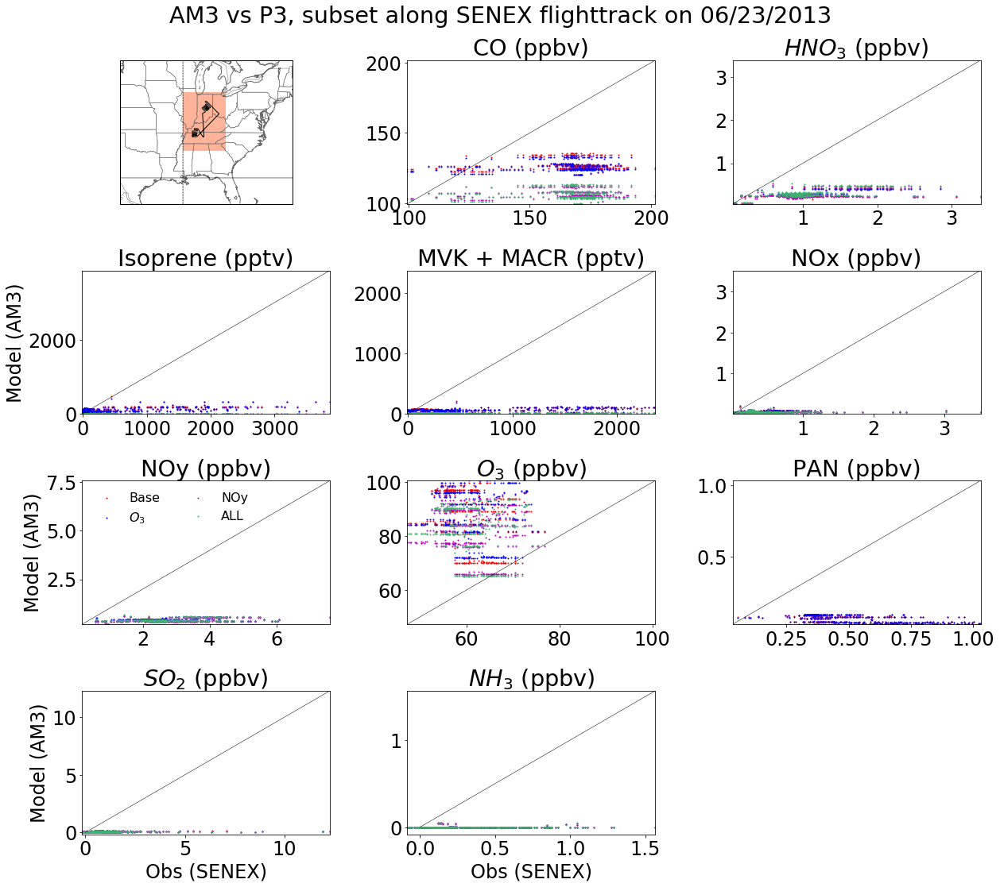

In [20]:
for dt in list(set(obs['DATE'])):
    mod_obs(dt)

# Old methods, validation stuff

## Retrieve AM3 along flight tracks (courtesy J. Mao)

In [55]:
modf = readsav('idl/mod_all_RunI3d_4_donnerfull.sav')

a3vars = ['TIME', 'PRES', 'O3', 'PAN', 'MPAN', 'R4N2', 
          'NO', 'NO2', 'NO3', 'HNO3', 'CO', 'SO2', 'TEMP', 'SPHUM']

mod = pd.DataFrame({ a3vars[0]: modf.am3[a3vars[0]][0].byteswap().newbyteorder(), 
                      a3vars[1]: modf.am3[a3vars[1]][0].byteswap().newbyteorder(), 
                      a3vars[2]: modf.am3[a3vars[2]][0].byteswap().newbyteorder(), 
                      a3vars[3]: modf.am3[a3vars[3]][0].byteswap().newbyteorder(), 
                      a3vars[4]: modf.am3[a3vars[4]][0].byteswap().newbyteorder(), 
                      a3vars[5]: modf.am3[a3vars[5]][0].byteswap().newbyteorder(), 
                      a3vars[6]: modf.am3[a3vars[6]][0].byteswap().newbyteorder(), 
                      a3vars[7]: modf.am3[a3vars[7]][0].byteswap().newbyteorder(), 
                      a3vars[8]: modf.am3[a3vars[8]][0].byteswap().newbyteorder(), 
                      a3vars[9]: modf.am3[a3vars[9]][0].byteswap().newbyteorder(), 
                      a3vars[10]: modf.am3[a3vars[10]][0].byteswap().newbyteorder(), 
                      a3vars[11]: modf.am3[a3vars[11]][0].byteswap().newbyteorder(), 
                      a3vars[12]: modf.am3[a3vars[12]][0].byteswap().newbyteorder(), 
                      a3vars[13]: modf.am3[a3vars[13]][0].byteswap().newbyteorder() })

mod['NOx'] = mod['NO'] + mod['NO2']
mod['NOy'] = mod['PAN'] + mod['MPAN'] + mod['R4N2'] + mod['NO'] + \
             mod['NO2'] + mod['NO3'] + mod['HNO3']

In [6]:
tvar = ['CO', 'HNO3', 'O3', 'PAN', 'SO2', 'NOx', 'NOy']

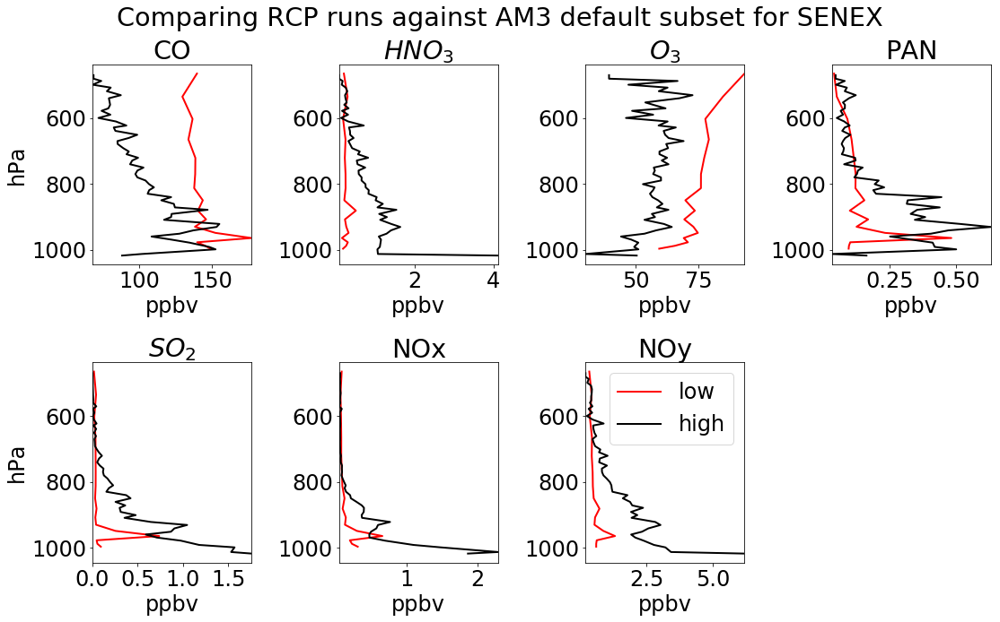

In [59]:
mod['pint'] = np.round(mod['PRES'], -1)
fig = plt.figure(figsize=[16,10])
mdp = mod.groupby('pint').mean()
bsp = base.groupby('pint').mean()
for idx, p in enumerate(tvar):
    ax = fig.add_subplot(2, 4, idx+1)
    mdp[p] = mdp[p]*1e9
    bsp.plot(p, 'PRES', ax=ax, label='low', c='r', linewidth=2, fontsize=24)
    mdp.plot(p, 'PRES', ax=ax, label='high', c='k', linewidth=2, fontsize=24)
    plt.xlim([np.min([mdp[p].min(), bsp[p].min()]), np.max([mdp[p].max(), bsp[p].max()])])
    plt.gca().invert_yaxis()
    if idx==6:
        plt.legend()
    else:
        ax.legend_.remove()
    plt.title(polvars[p][1])
    if idx%4==0:
        plt.ylabel('hPa')
    if p!='NOx':
        plt.xlabel(polvars[p][0][-4:].lower())
    else:
        plt.xlabel('ppbv')
plt.suptitle('Comparing RCP runs against AM3 default subset for SENEX')
plt.tight_layout()
plt.subplots_adjust(top=0.89)
#plt.savefig('senex_vertprof.cbb_vs_jqm.jpg')